In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
import scipy as sp
from scipy import sparse, io
import glob 
import re

Data was downloaded from GEO (accession number: GSE120221) and extracted. The data from GEO is just the raw counts and hasn't been QC-ed so will have to QC each sample myself. 

In [2]:
adatas = []
adata = sc.read('../data/oetjen/GSM3396161_matrix_A.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396161_barcodes_A.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396161_genes_A.tsv.gz', delimiter='\t', header=None)[1]

In [3]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

In [4]:
adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

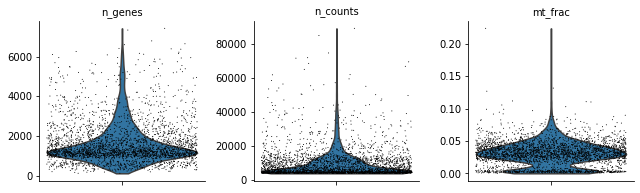

In [5]:
# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

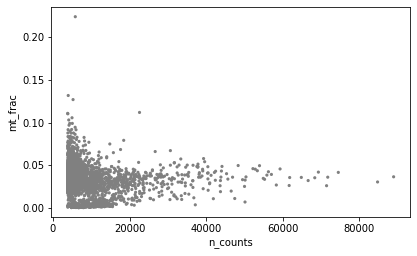

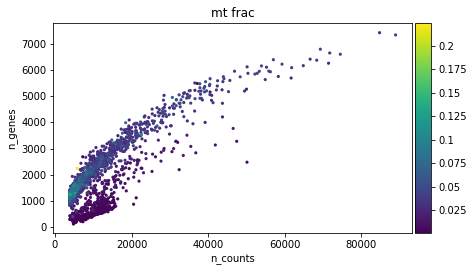

In [6]:
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

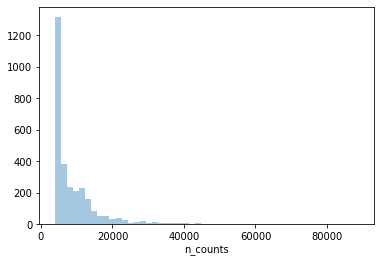

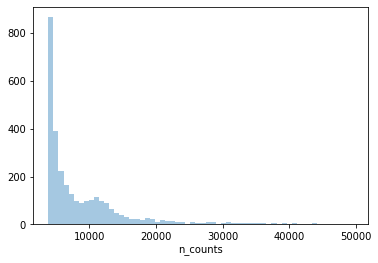

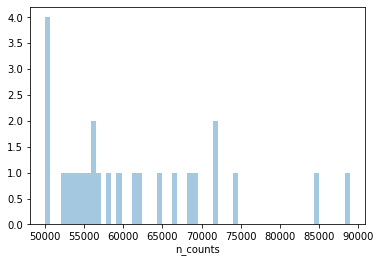

In [7]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<50000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>50000], kde=False, bins=60)
plt.show()

In [8]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 80000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 2994


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 2992
Number of cells after MT filter: 2991


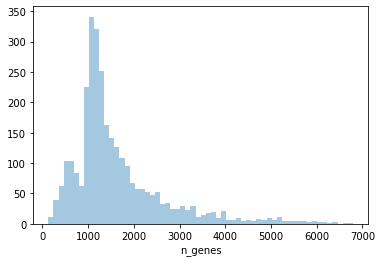

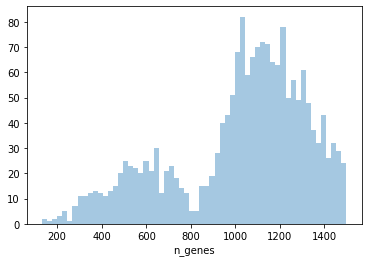

In [9]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1500], kde=False, bins=60)
plt.show()

In [10]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 800)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 2991


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 2586


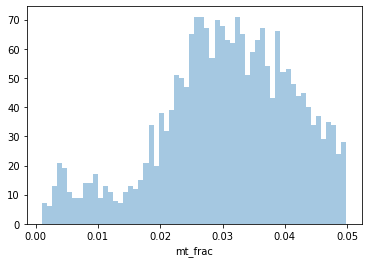

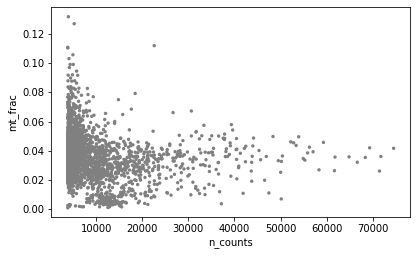

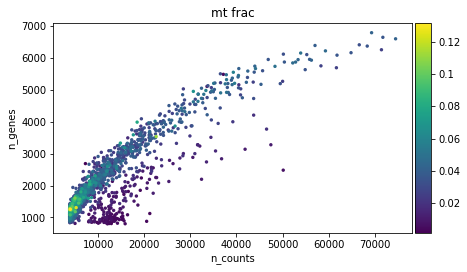

In [11]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.05], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [12]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.015) | (adata.obs['n_counts'] > 20000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 2586
Number of cells after filter: 2412


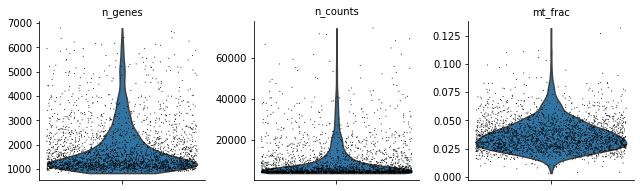

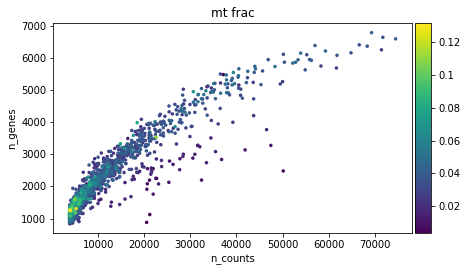

In [13]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [14]:
adata.obs_names = adata.obs_names.values + '-sampleA'

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [15]:
adata.var_names_make_unique()
adatas.append(adata)

In [16]:
adata = sc.read('../data/oetjen/GSM3396162_matrix_B.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396162_barcodes_B.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396162_genes_B.tsv.gz', delimiter='\t', header=None)[1]

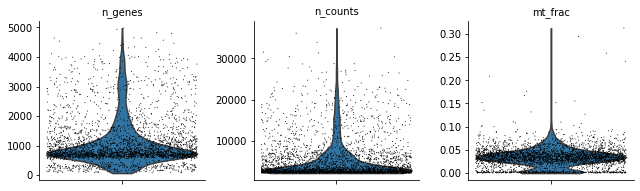

In [17]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

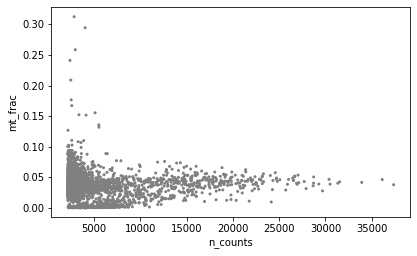

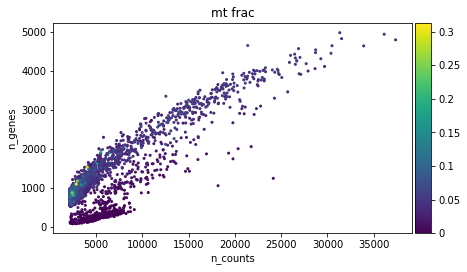

In [18]:
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

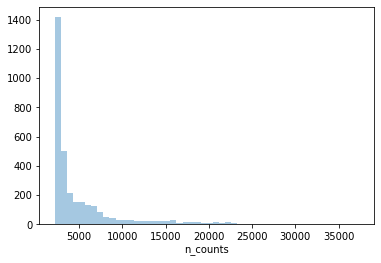

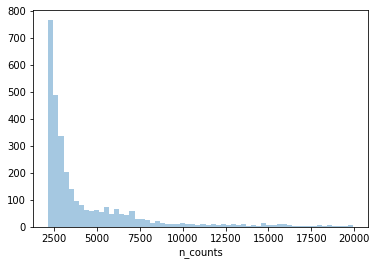

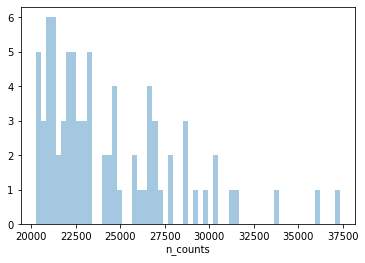

In [19]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<20000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [20]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 30000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 3293


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 3286
Number of cells after MT filter: 3281


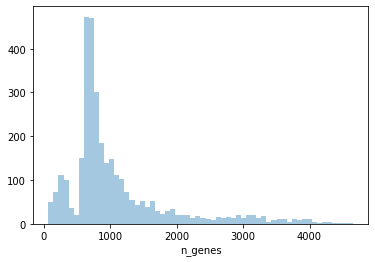

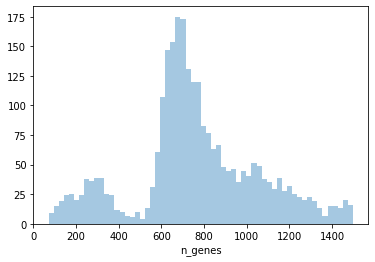

In [21]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1500], kde=False, bins=60)
plt.show()


In [22]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 500)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 3281


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 2899


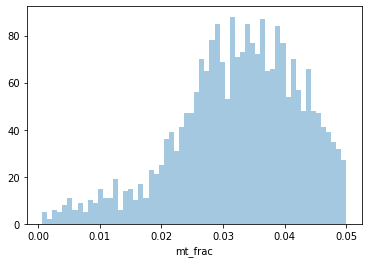

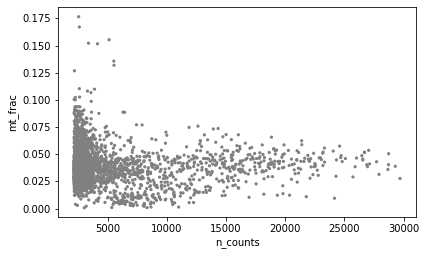

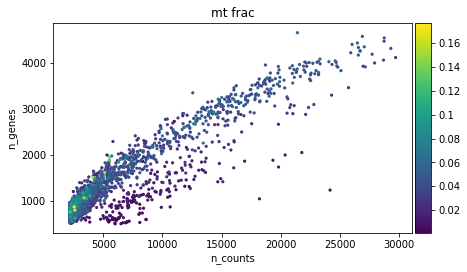

In [23]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.05], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [24]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.01) | (adata.obs['n_counts'] > 10000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 2899
Number of cells after filter: 2825


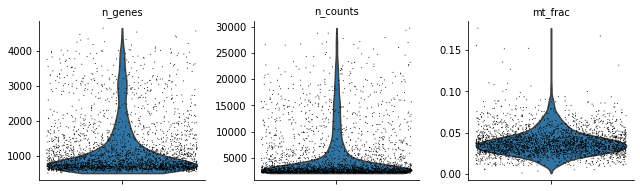

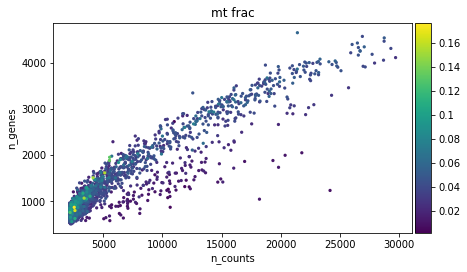

In [25]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [26]:
adata.obs_names = adata.obs_names.values + '-sampleB'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [27]:
adata = sc.read('../data/oetjen/GSM3396163_matrix_C1.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396163_barcodes_C1.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396163_genes_C1.tsv.gz', delimiter='\t', header=None)[1]

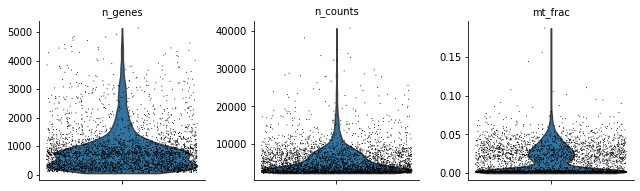

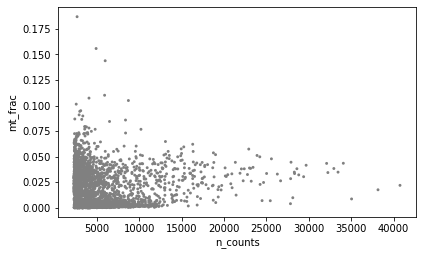

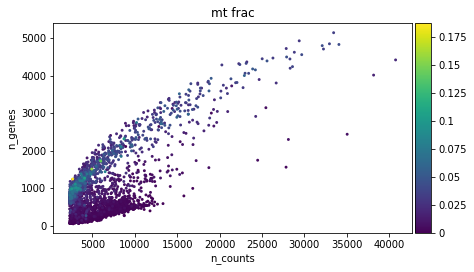

In [28]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')


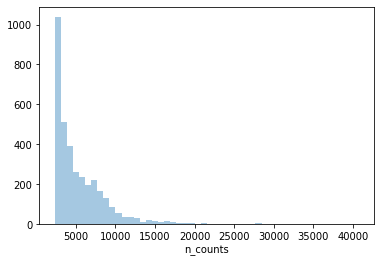

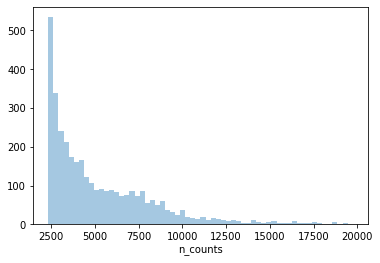

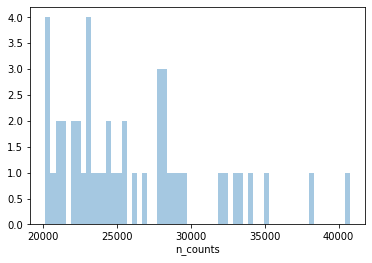

In [29]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<20000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [30]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 35000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.125]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 3556


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 3553
Number of cells after MT filter: 3550


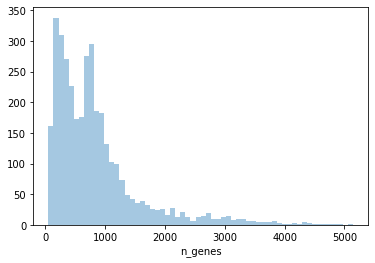

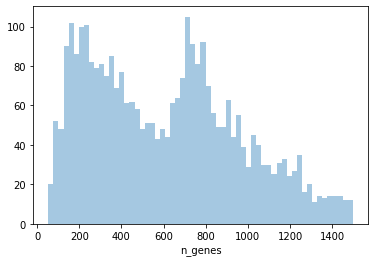

In [31]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1500], kde=False, bins=60)
plt.show()

In [32]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 600)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 3550


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 1991


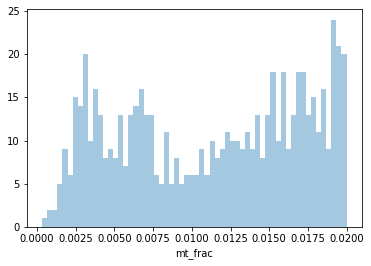

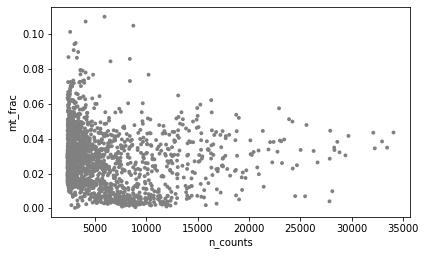

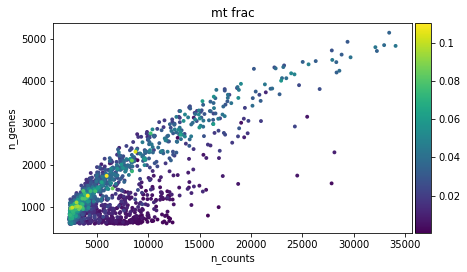

In [33]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [34]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.005) | (adata.obs['n_counts'] > 10000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 1991
Number of cells after filter: 1886


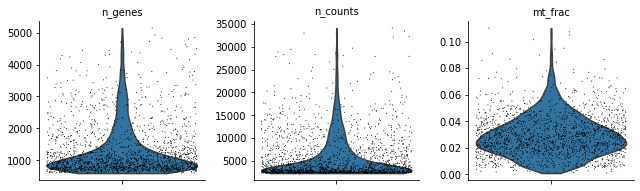

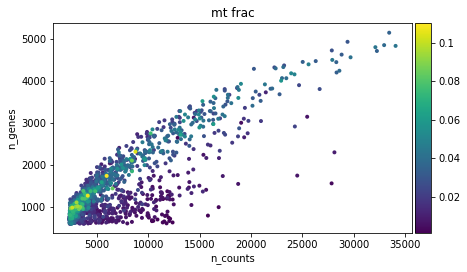

In [35]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [36]:
adata.obs_names = adata.obs_names.values + '-sampleC1'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


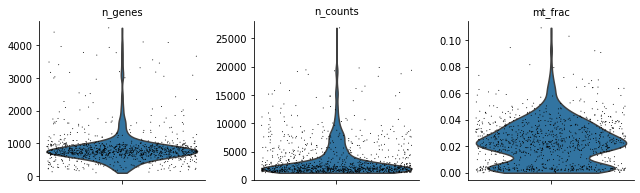

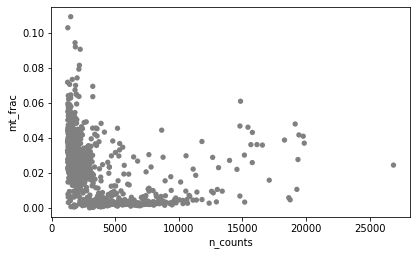

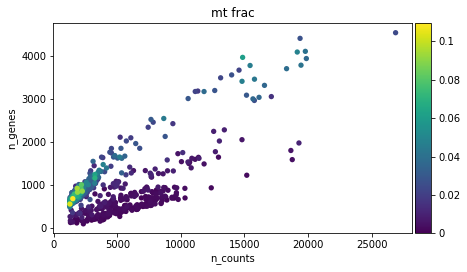

In [37]:
adata = sc.read('../data/oetjen/GSM3396164_matrix_Ck.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396164_barcodes_Ck.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396164_genes_Ck.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

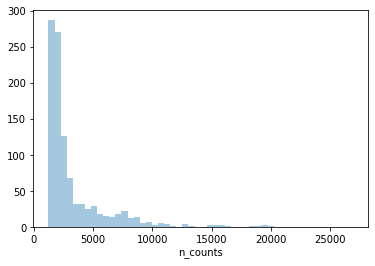

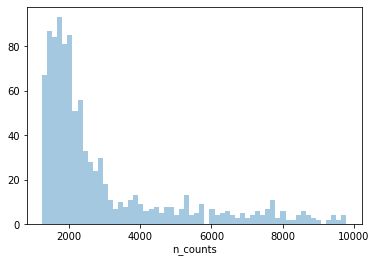

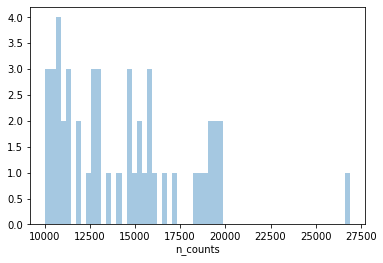

In [38]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<10000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>10000], kde=False, bins=60)
plt.show()

In [39]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 20000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.1]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Total number of cells: 1052
Number of cells after max count filter: 1051
Number of cells after MT filter: 1049


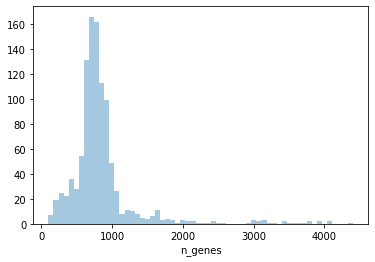

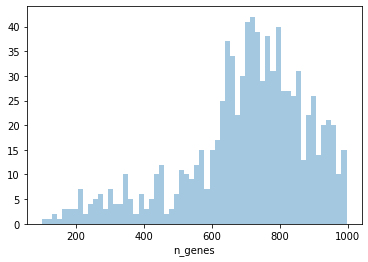

In [40]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1000], kde=False, bins=60)
plt.show()


In [41]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 500)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Total number of cells: 1049


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 933


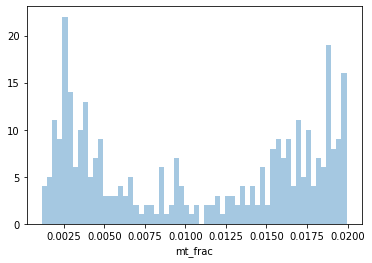

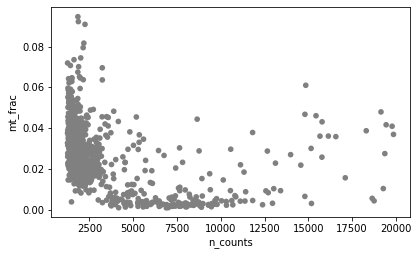

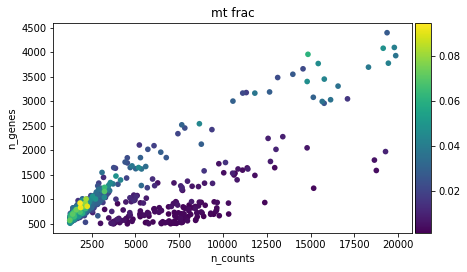

In [42]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [43]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.005) | (adata.obs['n_counts'] > 7500)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))


Total number of cells: 933
Number of cells after filter: 875


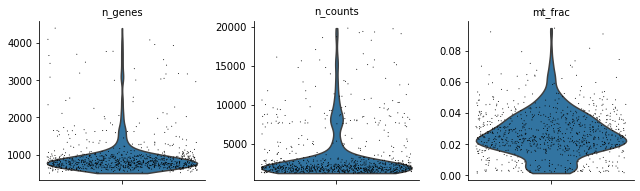

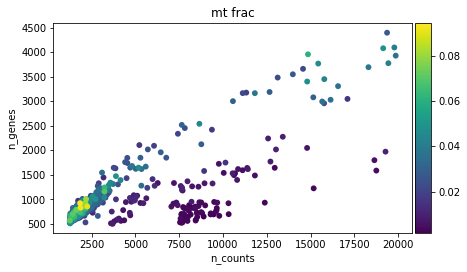

In [44]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [45]:
adata.obs_names = adata.obs_names.values + '-sampleCk'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


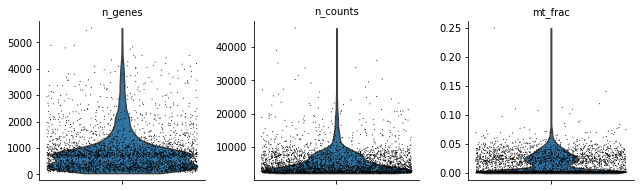

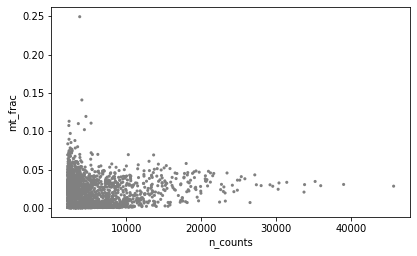

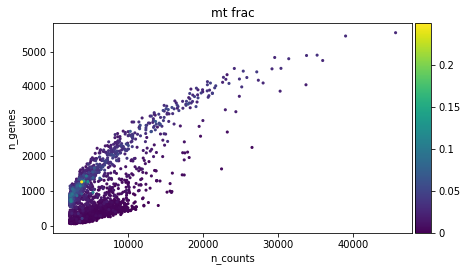

In [46]:
adata = sc.read('../data/oetjen/GSM3396165_matrix_C2.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396165_barcodes_C2.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396165_genes_C2.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

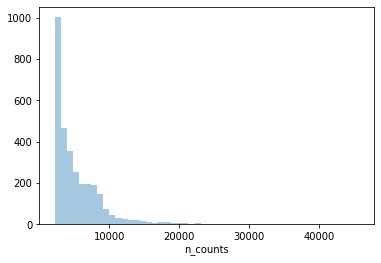

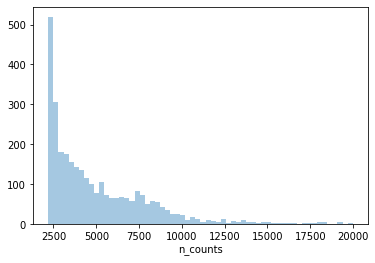

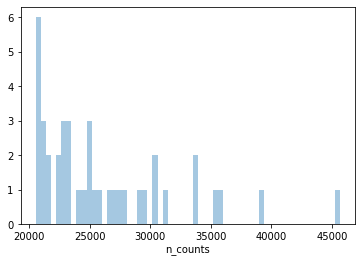

In [47]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<20000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [48]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 40000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 3136


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 3135
Number of cells after MT filter: 3134


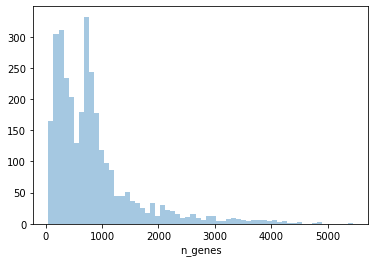

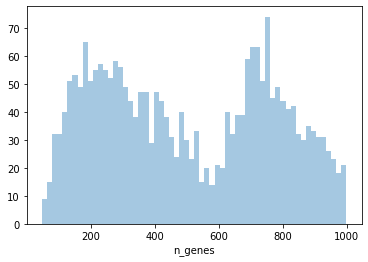

In [49]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1000], kde=False, bins=60)
plt.show()

In [50]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 500)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 3134


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 1914


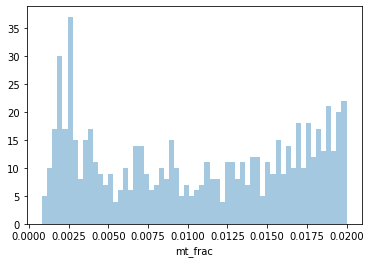

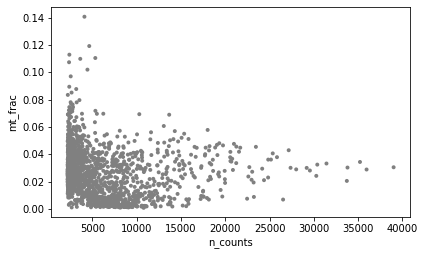

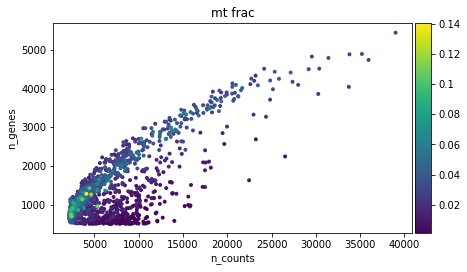

In [51]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [52]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.005) | (adata.obs['n_counts'] > 10000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 1914
Number of cells after filter: 1740


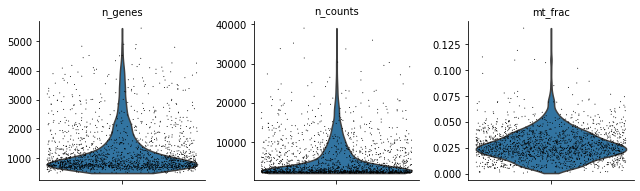

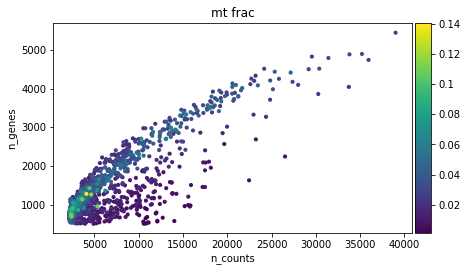

In [53]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [54]:
adata.obs_names = adata.obs_names.values + '-sampleC2'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


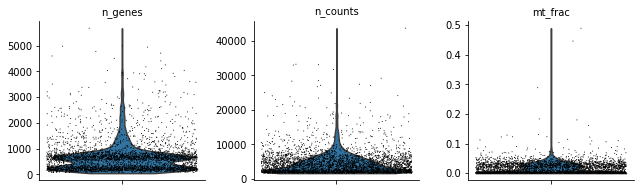

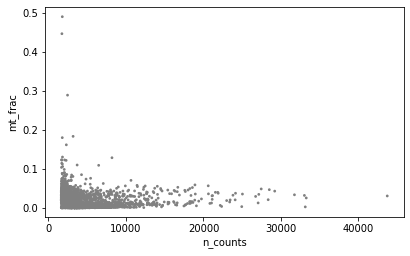

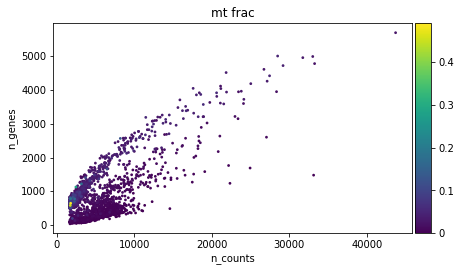

In [55]:
adata = sc.read('../data/oetjen/GSM3396166_matrix_E.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396166_barcodes_E.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396166_genes_E.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

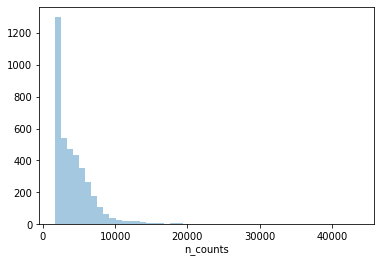

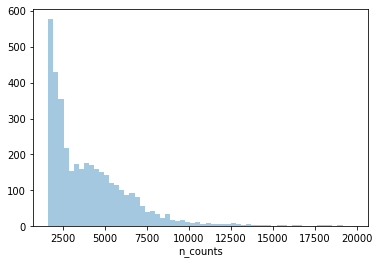

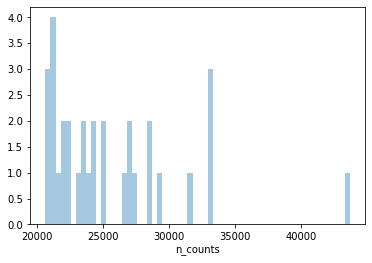

In [56]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<20000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [57]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 40000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 3939


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 3938
Number of cells after MT filter: 3935


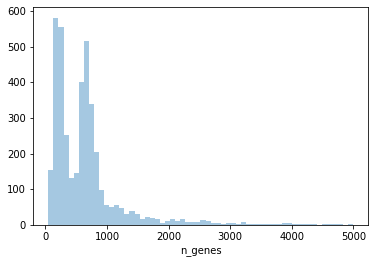

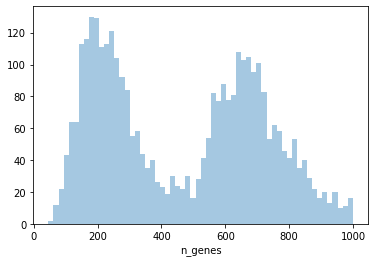

In [58]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1000], kde=False, bins=60)
plt.show()

In [59]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 500)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 3935


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 2198


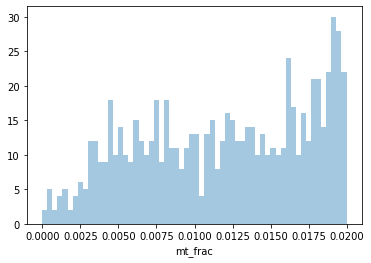

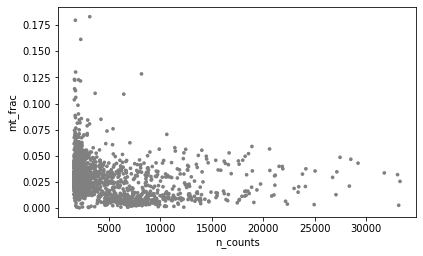

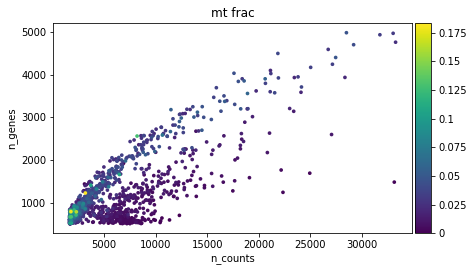

In [60]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [61]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.005) | (adata.obs['n_counts'] > 10000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 2198
Number of cells after filter: 2105


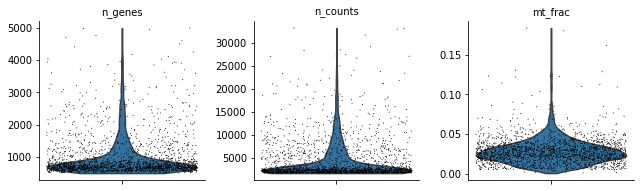

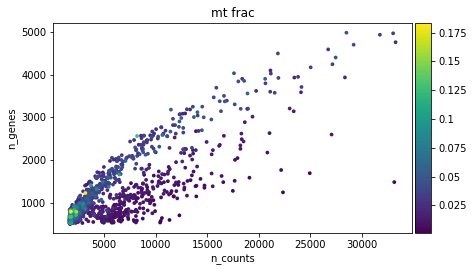

In [62]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [63]:
adata.obs_names = adata.obs_names.values + '-sampleE'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


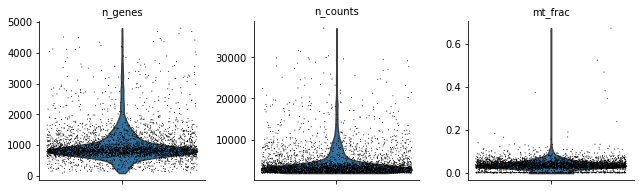

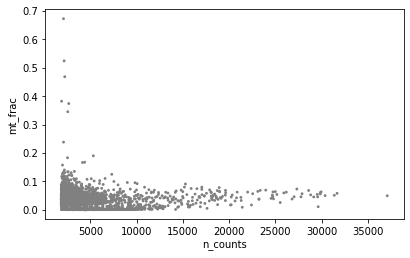

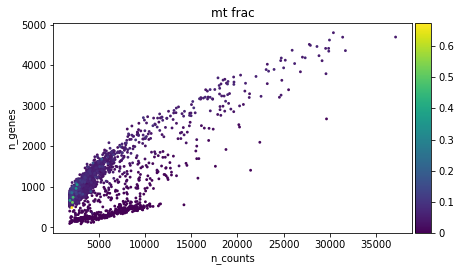

In [64]:
adata = sc.read('../data/oetjen/GSM3396167_matrix_F.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396167_barcodes_F.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396167_genes_F.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

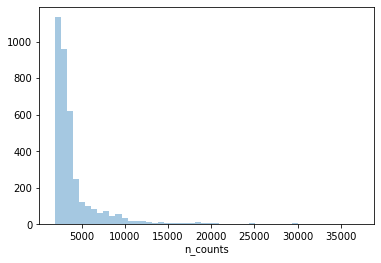

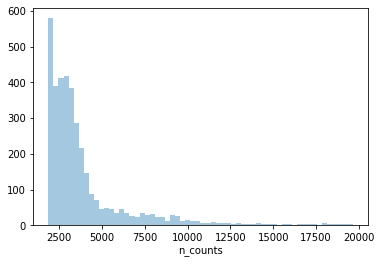

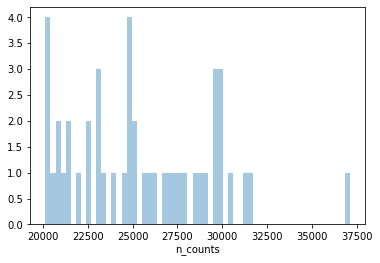

In [65]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<20000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [66]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 35000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 3746


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 3745
Number of cells after MT filter: 3738


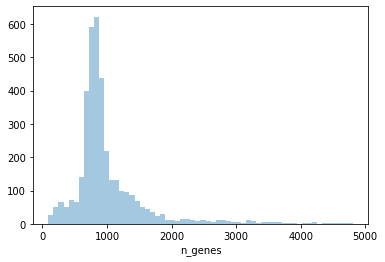

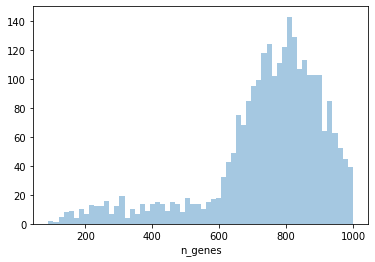

In [67]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1000], kde=False, bins=60)
plt.show()

In [68]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 500)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 3738


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 3468


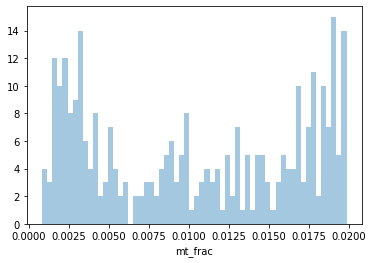

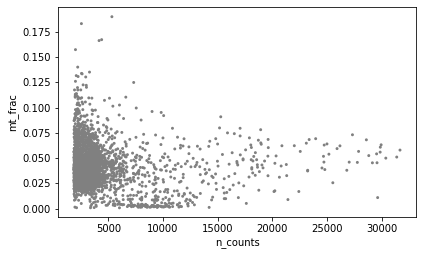

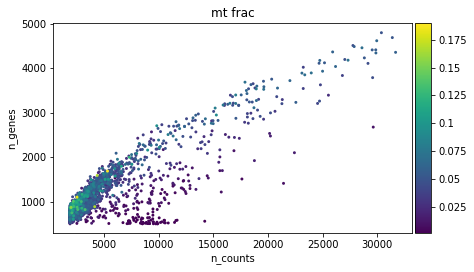

In [69]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [70]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.005) | (adata.obs['n_counts'] > 10000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 3468
Number of cells after filter: 3390


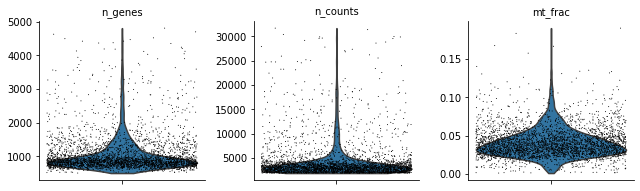

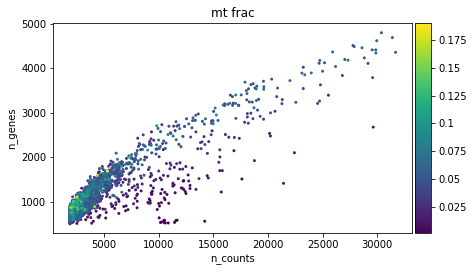

In [71]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [72]:
adata.obs_names = adata.obs_names.values + '-sampleF'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


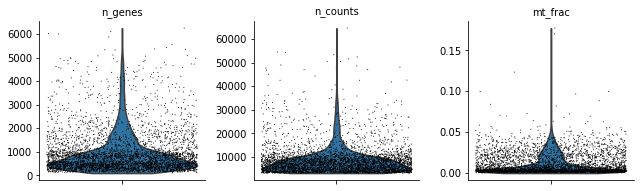

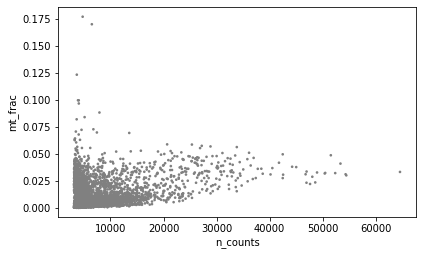

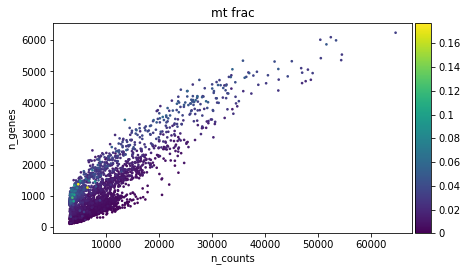

In [73]:
adata = sc.read('../data/oetjen/GSM3396168_matrix_G.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396168_barcodes_G.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396168_genes_G.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

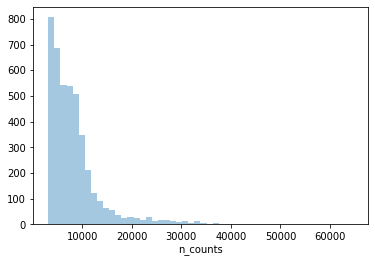

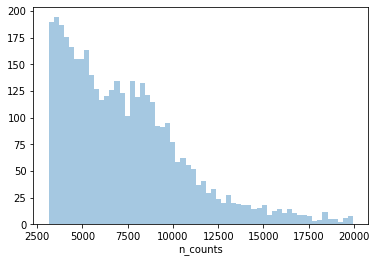

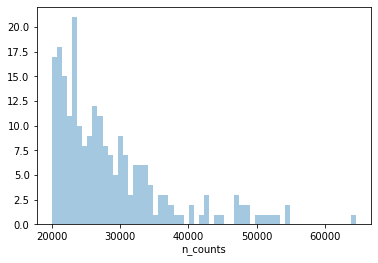

In [74]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<20000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [75]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 60000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.1]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 4283


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 4282
Number of cells after MT filter: 4279


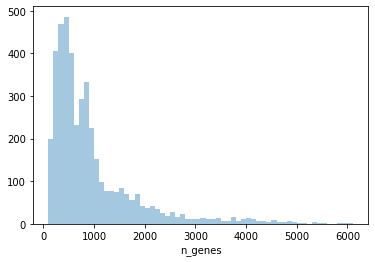

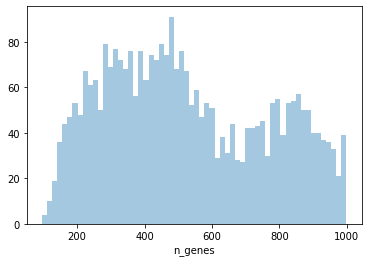

In [76]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1000], kde=False, bins=60)
plt.show()

In [77]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 500)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 4279


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 2705


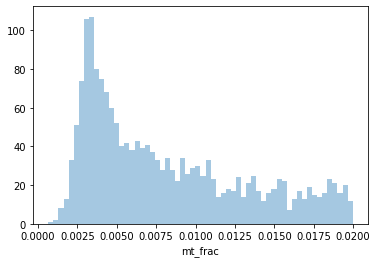

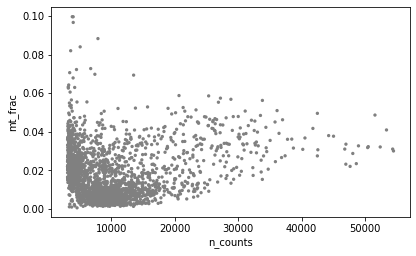

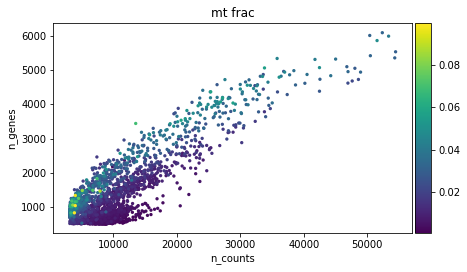

In [78]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [79]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.0025) | (adata.obs['n_counts'] > 10000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 2705
Number of cells after filter: 2634


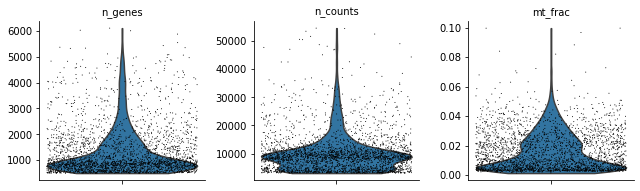

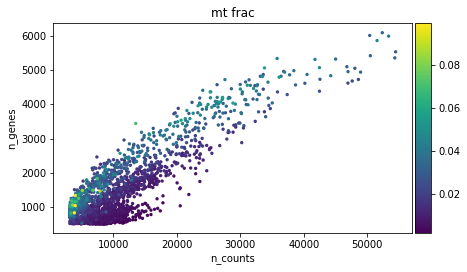

In [80]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [81]:
adata.obs_names = adata.obs_names.values + '-sampleG'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


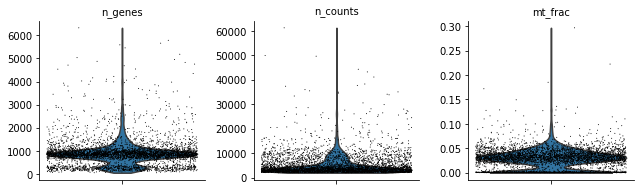

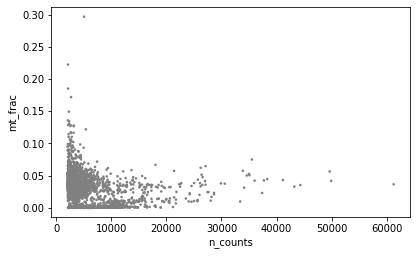

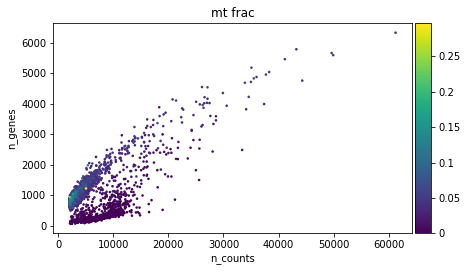

In [82]:
adata = sc.read('../data/oetjen/GSM3396169_matrix_H.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396169_barcodes_H.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396169_genes_H.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

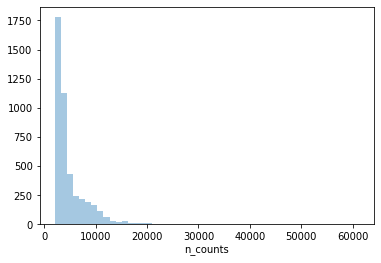

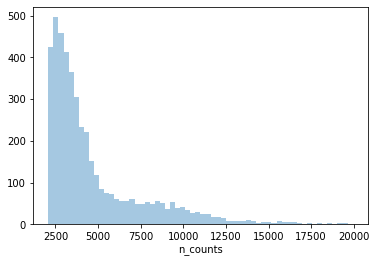

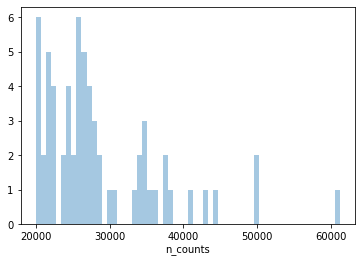

In [83]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<20000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [84]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 50000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.15]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 4516


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 4515
Number of cells after MT filter: 4511


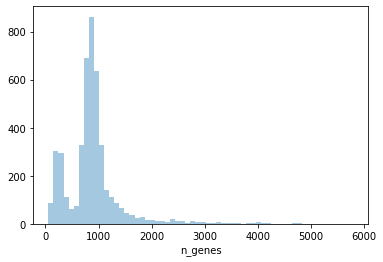

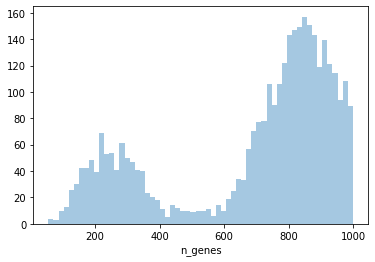

In [85]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1000], kde=False, bins=60)
plt.show()

In [86]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 500)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 4511


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 3671


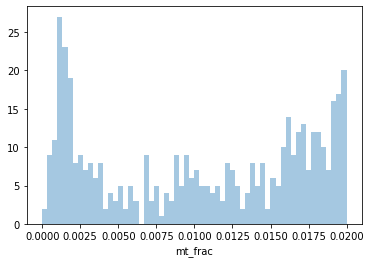

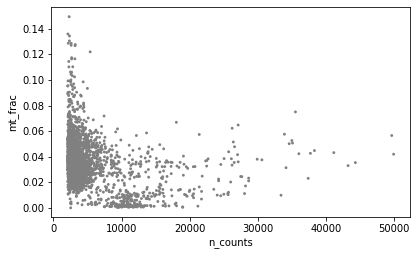

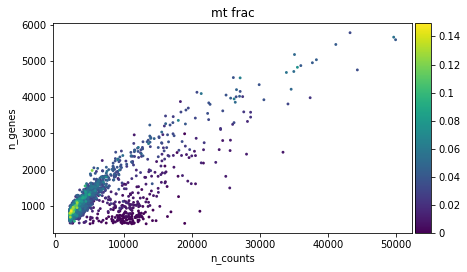

In [87]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [88]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.005) | (adata.obs['n_counts'] > 15000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 3671
Number of cells after filter: 3536


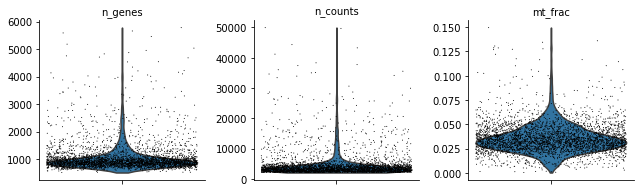

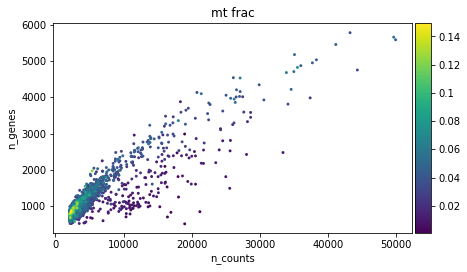

In [89]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [90]:
adata.obs_names = adata.obs_names.values + '-sampleH'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


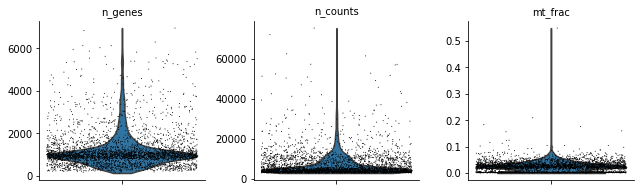

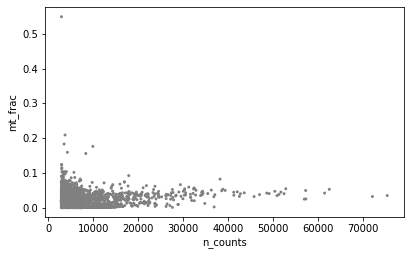

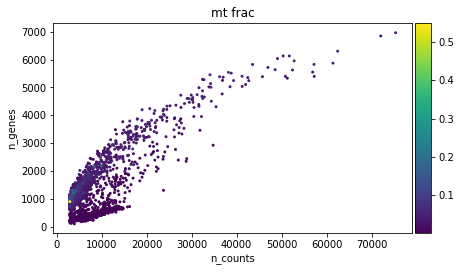

In [91]:
adata = sc.read('../data/oetjen/GSM3396170_matrix_J.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396170_barcodes_J.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396170_genes_J.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

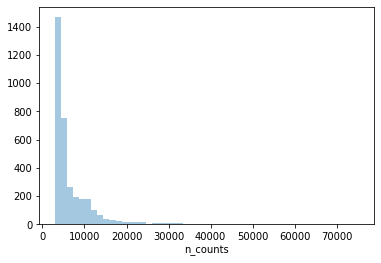

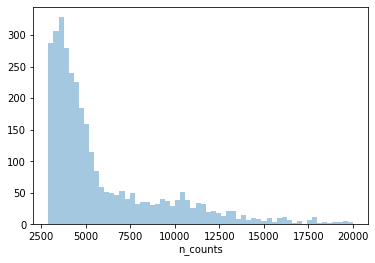

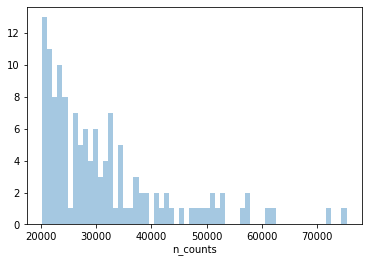

In [92]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<20000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [93]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 60000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.15]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 3446


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 3442
Number of cells after MT filter: 3436


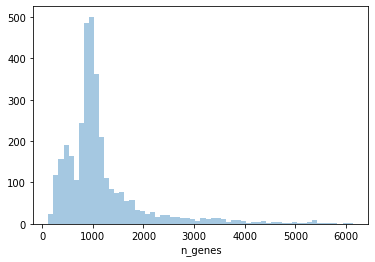

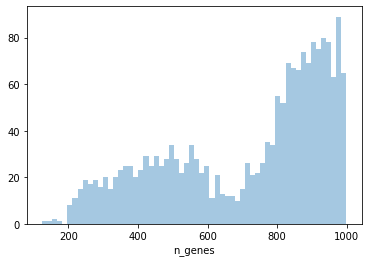

In [94]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1000], kde=False, bins=60)
plt.show()

In [95]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 500)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 3436


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 2999


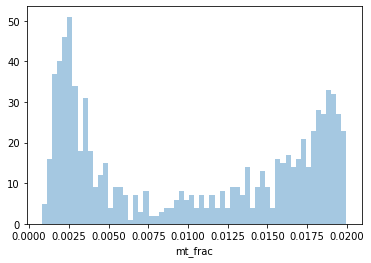

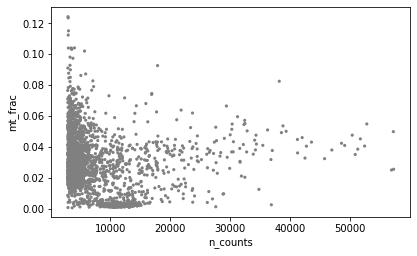

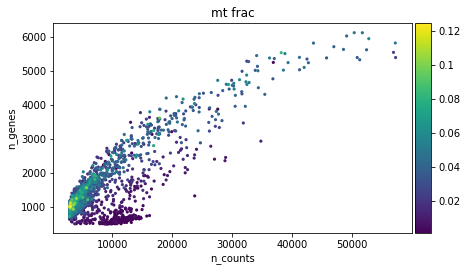

In [96]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [97]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.005) | (adata.obs['n_counts'] > 15000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 2999
Number of cells after filter: 2679


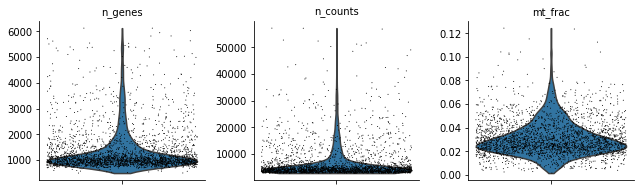

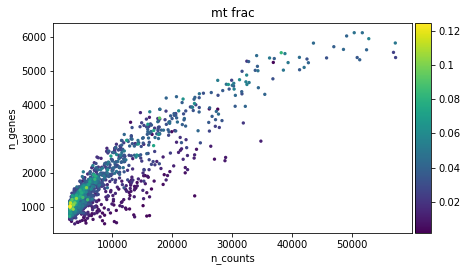

In [98]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [99]:
adata.obs_names = adata.obs_names.values + '-sampleJ'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


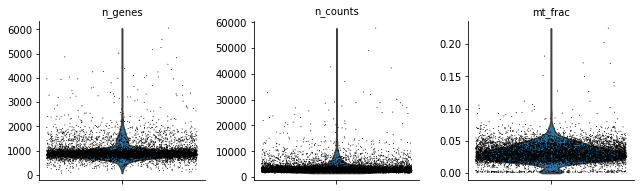

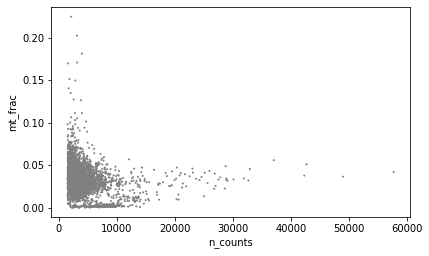

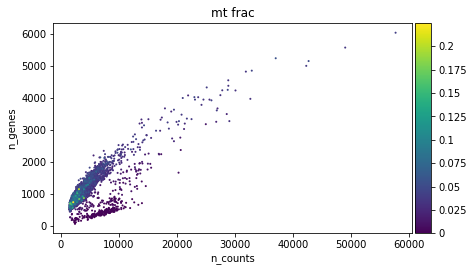

In [100]:
adata = sc.read('../data/oetjen/GSM3396171_matrix_K.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396171_barcodes_K.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396171_genes_K.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

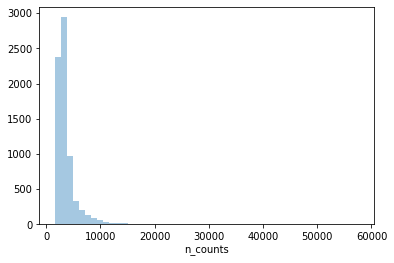

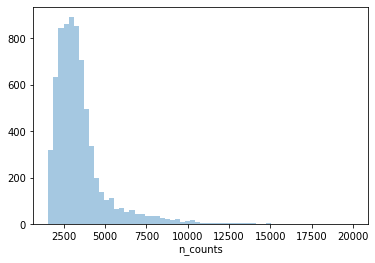

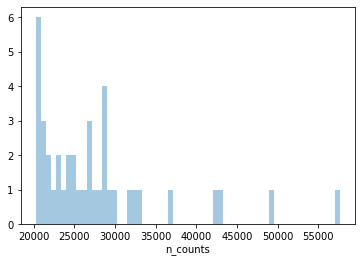

In [101]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<20000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [102]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 40000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.15]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 7247


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 7243
Number of cells after MT filter: 7237


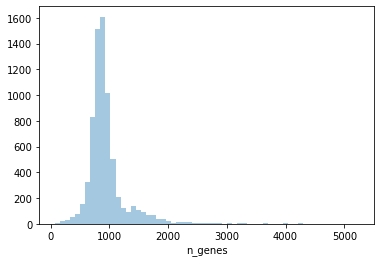

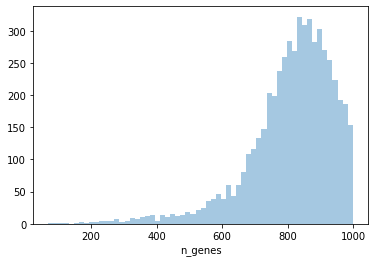

In [103]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1000], kde=False, bins=60)
plt.show()

In [104]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 500)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 7237


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 7055


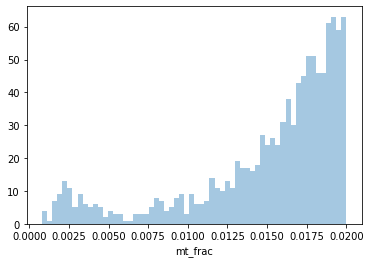

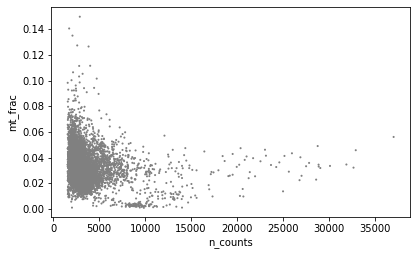

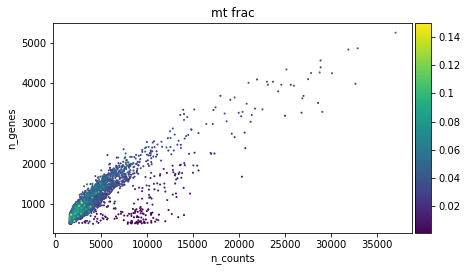

In [105]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [106]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.005) | (adata.obs['n_counts'] > 15000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 7055
Number of cells after filter: 6971


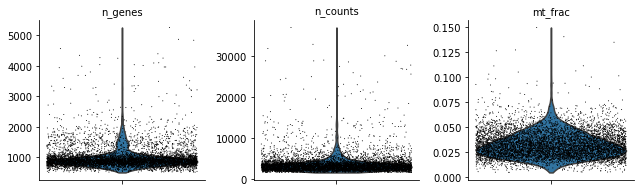

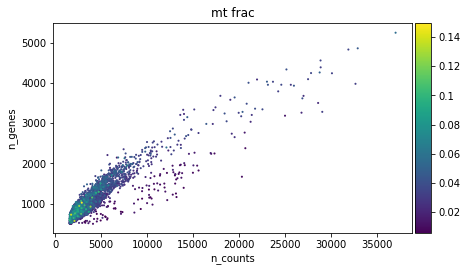

In [107]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [108]:
adata.obs_names = adata.obs_names.values + '-sampleK'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


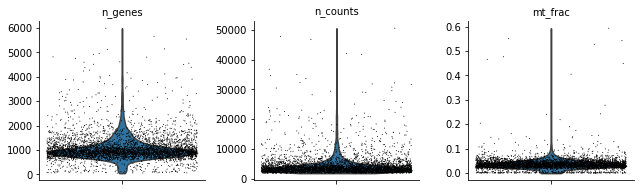

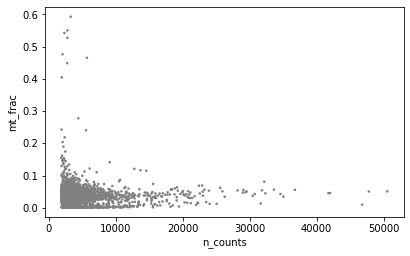

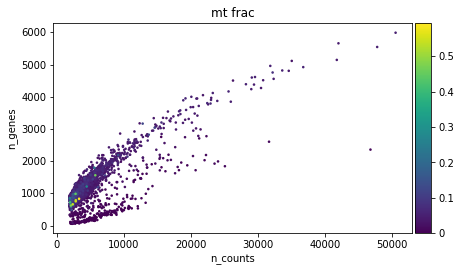

In [109]:
adata = sc.read('../data/oetjen/GSM3396172_matrix_L.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396172_barcodes_L.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396172_genes_L.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

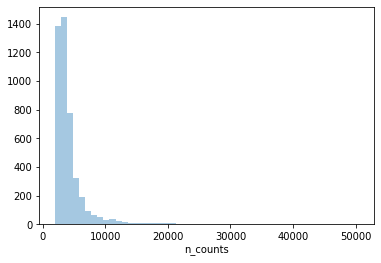

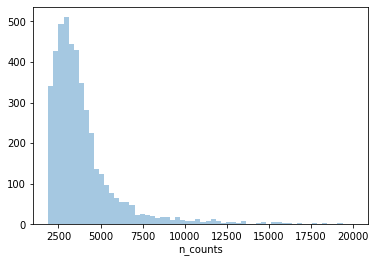

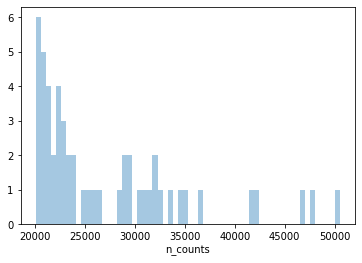

In [110]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<20000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [111]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 40000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 4548


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 4543
Number of cells after MT filter: 4530


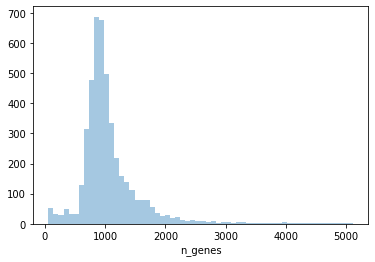

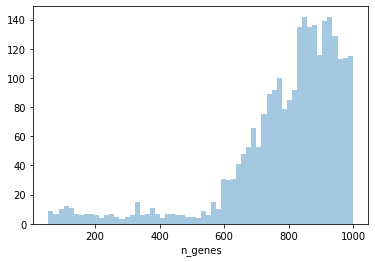

In [112]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1000], kde=False, bins=60)
plt.show()

In [113]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 500)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 4530


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 4328


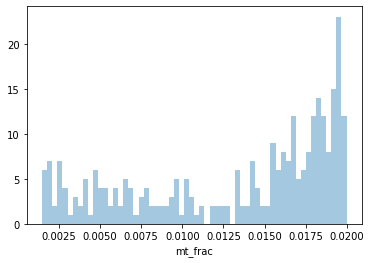

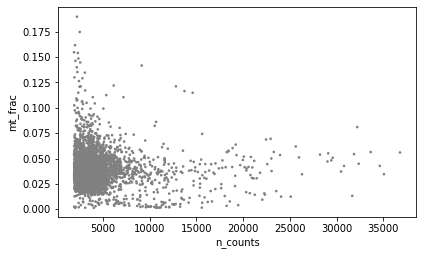

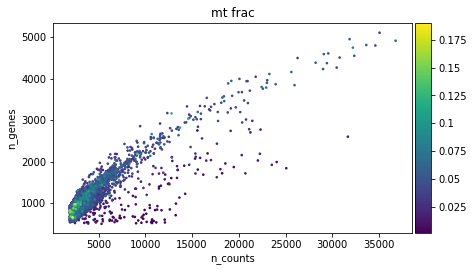

In [114]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [115]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.01) | (adata.obs['n_counts'] > 15000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 4328
Number of cells after filter: 4243


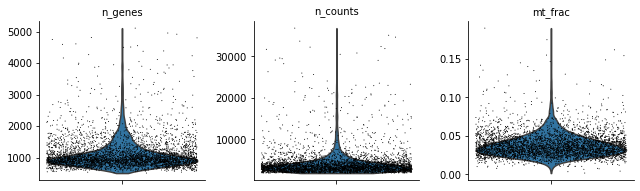

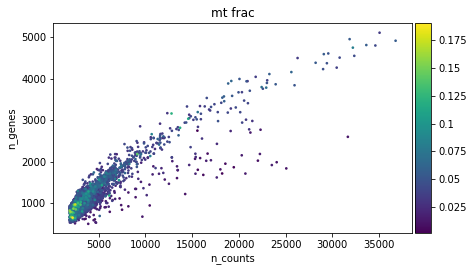

In [116]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [117]:
adata.obs_names = adata.obs_names.values + '-sampleL'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


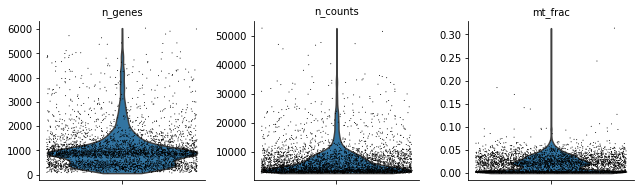

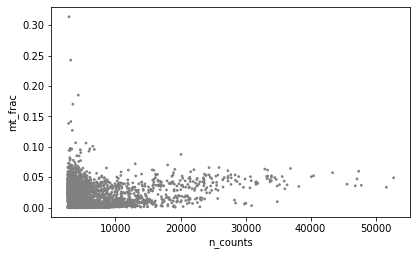

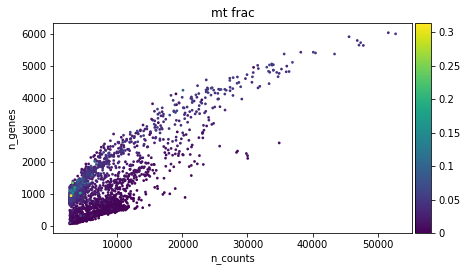

In [118]:
adata = sc.read('../data/oetjen/GSM3396173_matrix_M.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396173_barcodes_M.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396173_genes_M.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

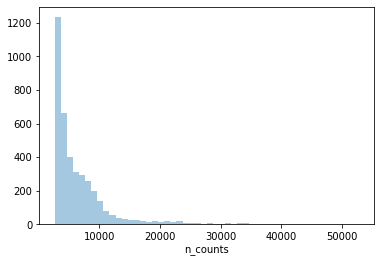

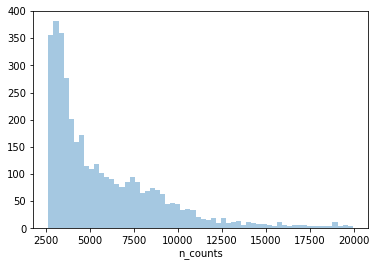

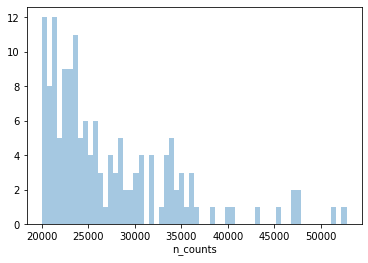

In [120]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<20000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [121]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 50000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.15]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 3964


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 3962
Number of cells after MT filter: 3958


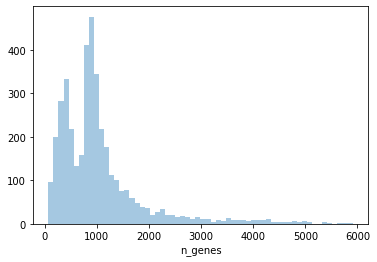

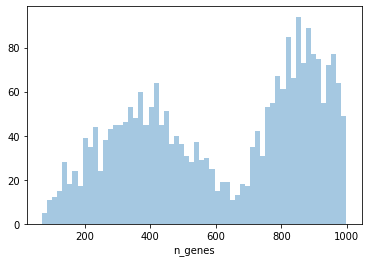

In [122]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1000], kde=False, bins=60)
plt.show()

In [123]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 600)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 3958


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 2754


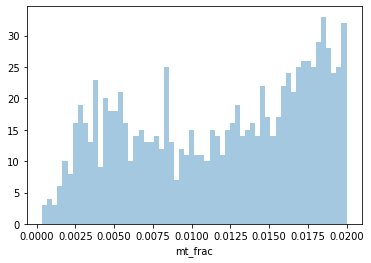

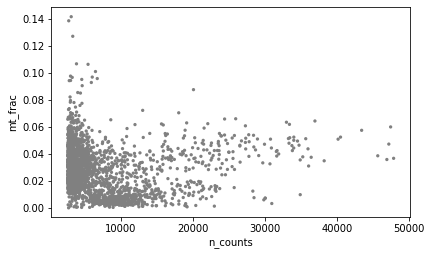

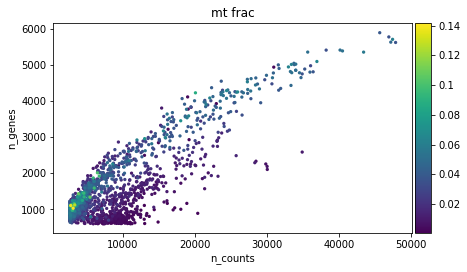

In [124]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [125]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.005) | (adata.obs['n_counts'] > 20000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 2754
Number of cells after filter: 2582


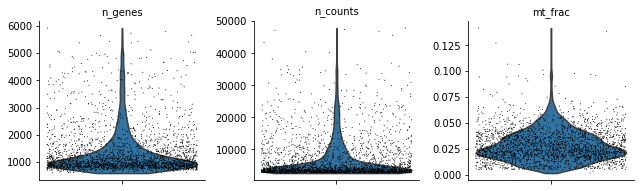

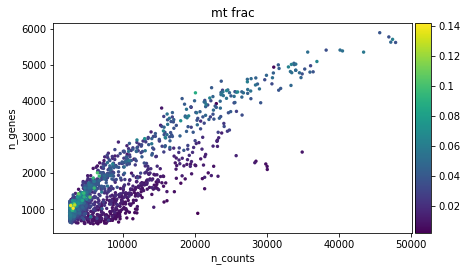

In [126]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [127]:
adata.obs_names = adata.obs_names.values + '-sampleM'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


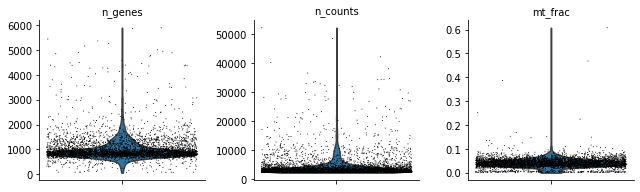

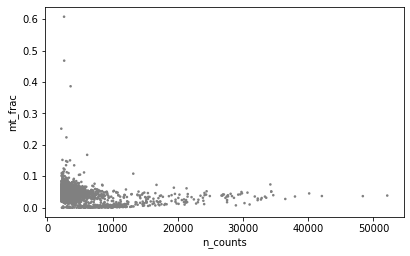

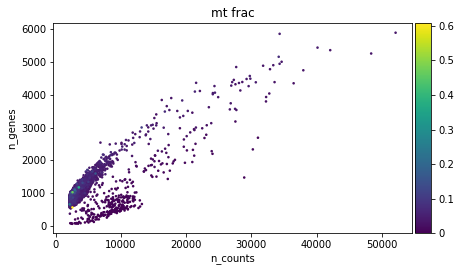

In [128]:
adata = sc.read('../data/oetjen/GSM3396174_matrix_N.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396174_barcodes_N.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396174_genes_N.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

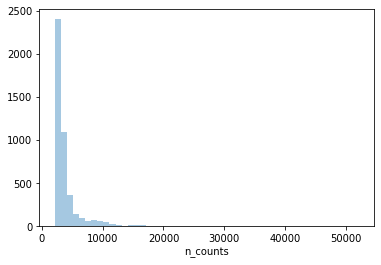

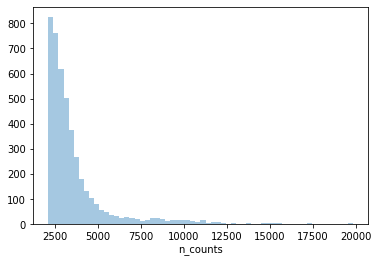

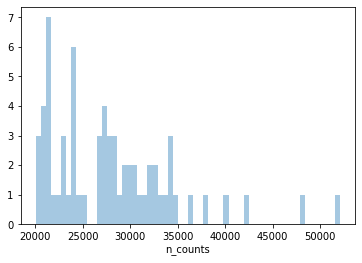

In [129]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<20000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [130]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 45000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 4522


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 4520
Number of cells after MT filter: 4515


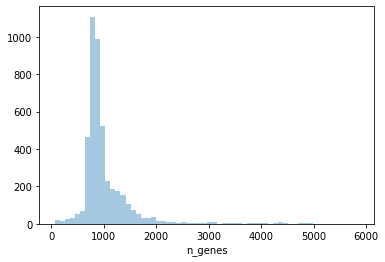

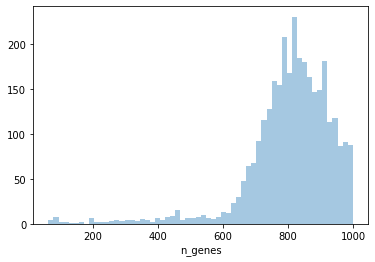

In [131]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1000], kde=False, bins=60)
plt.show()

In [132]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 500)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 4515


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 4400


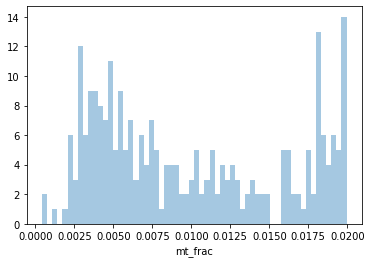

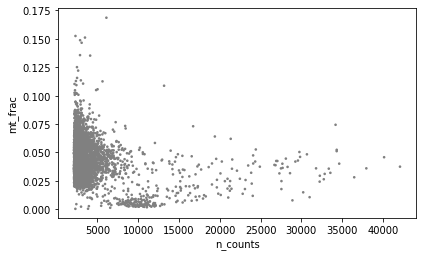

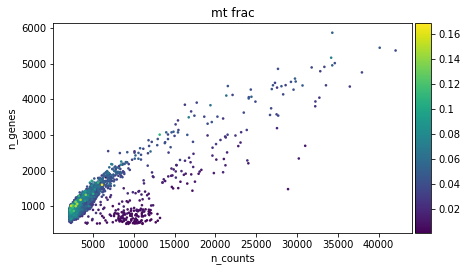

In [133]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [134]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.01) | (adata.obs['n_counts'] > 20000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 4400
Number of cells after filter: 4256


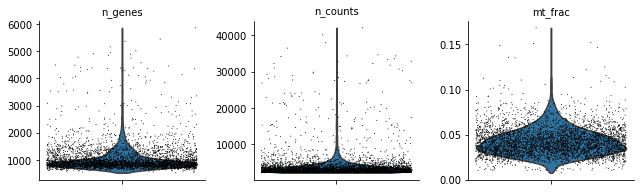

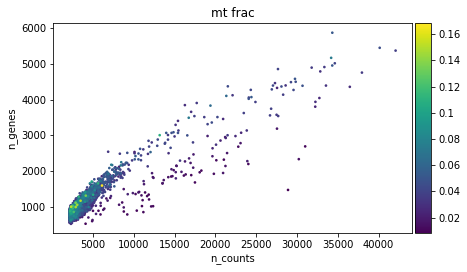

In [135]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [136]:
adata.obs_names = adata.obs_names.values + '-sampleN'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


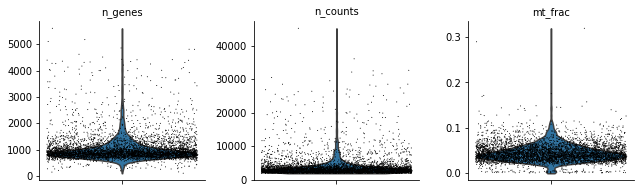

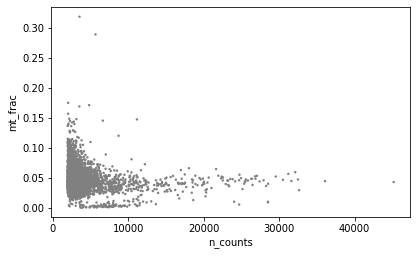

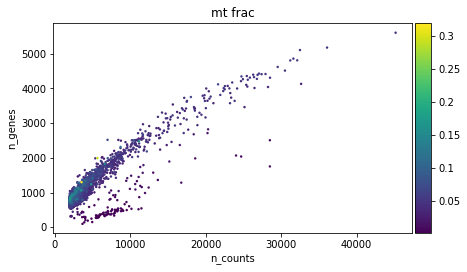

In [137]:
adata = sc.read('../data/oetjen/GSM3396175_matrix_O.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396175_barcodes_O.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396175_genes_O.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

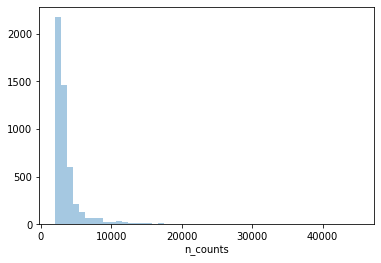

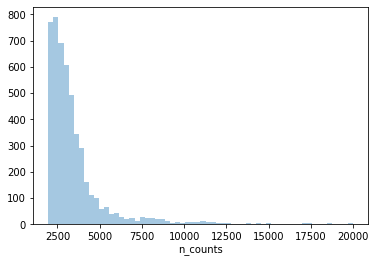

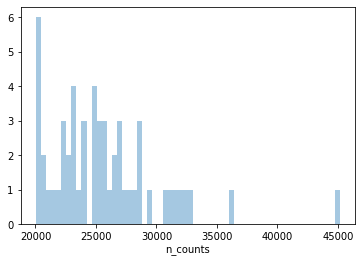

In [138]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<20000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [139]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 40000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 5013


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 5012
Number of cells after MT filter: 5010


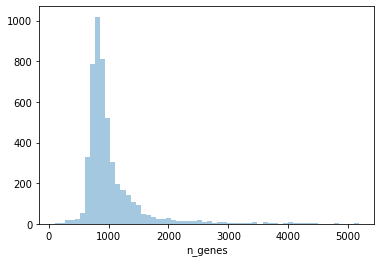

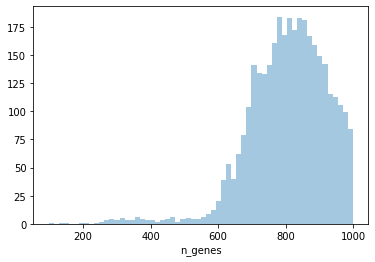

In [140]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1000], kde=False, bins=60)
plt.show()

In [141]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 500)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 5010


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 4945


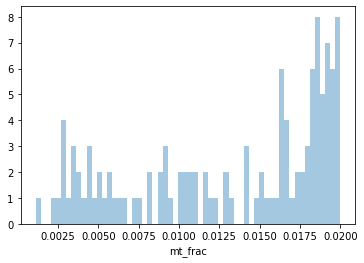

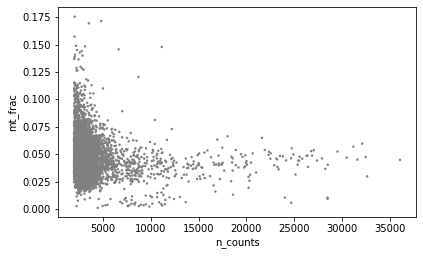

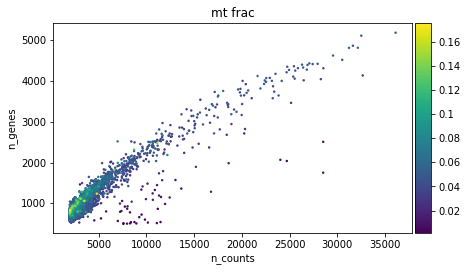

In [142]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [143]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.01) | (adata.obs['n_counts'] > 20000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 4945
Number of cells after filter: 4911


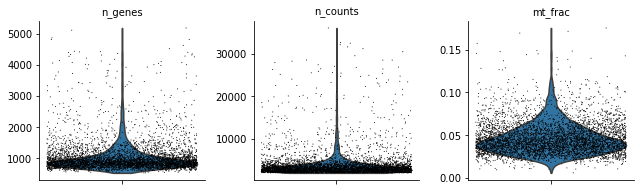

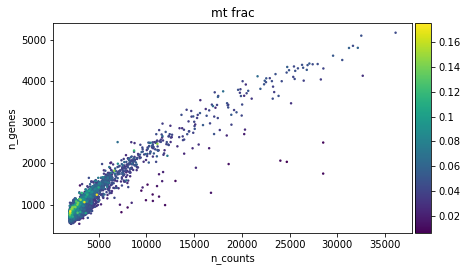

In [144]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [145]:
adata.obs_names = adata.obs_names.values + '-sampleO'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


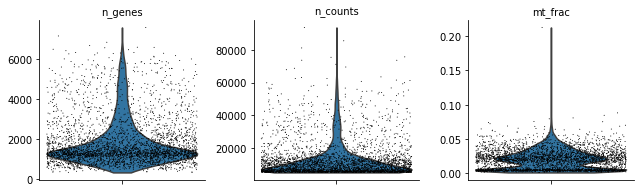

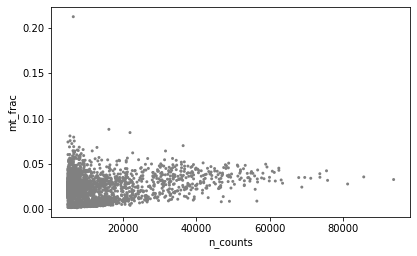

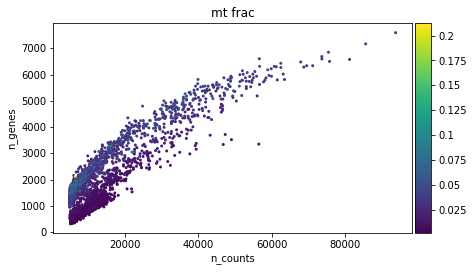

In [146]:
adata = sc.read('../data/oetjen/GSM3396176_matrix_P.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396176_barcodes_P.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396176_genes_P.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

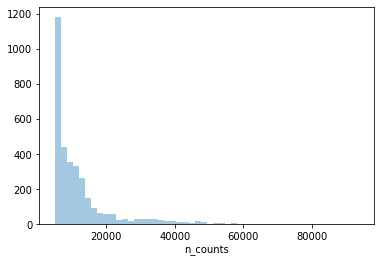

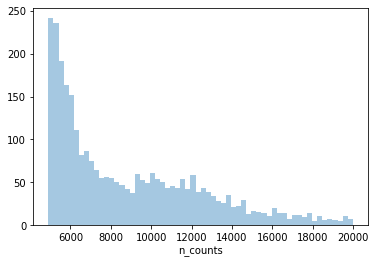

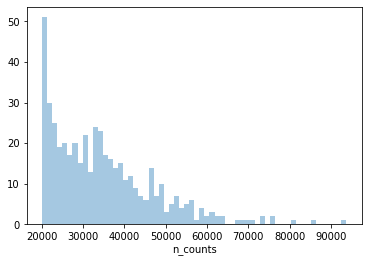

In [147]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<20000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [148]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 65000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.1]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 3383


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 3372
Number of cells after MT filter: 3371


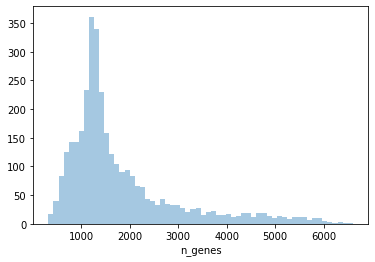

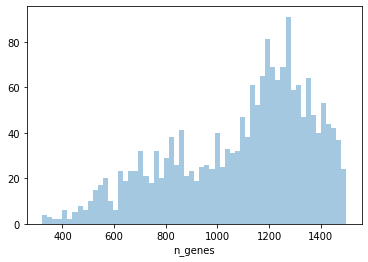

In [149]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1500], kde=False, bins=60)
plt.show()

In [150]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 600)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 3371


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 3257


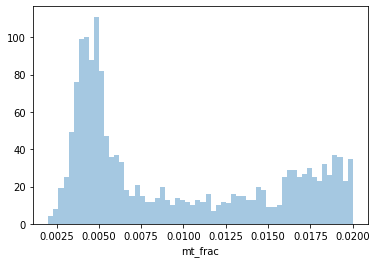

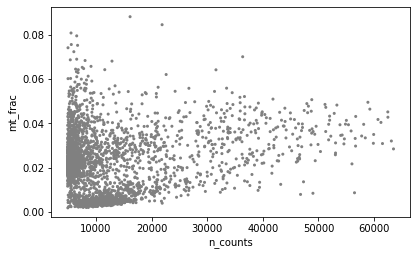

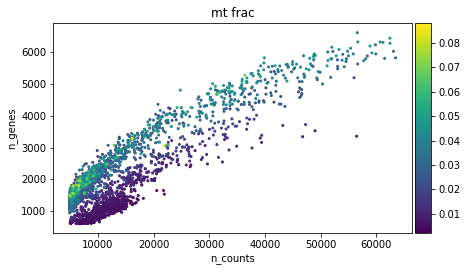

In [151]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [152]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.0075) | (adata.obs['n_counts'] > 20000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 3257
Number of cells after filter: 2390


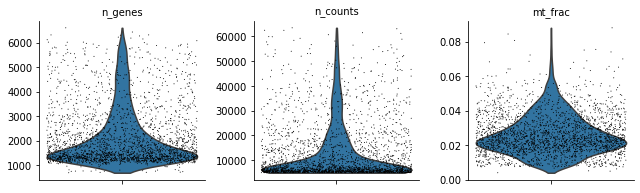

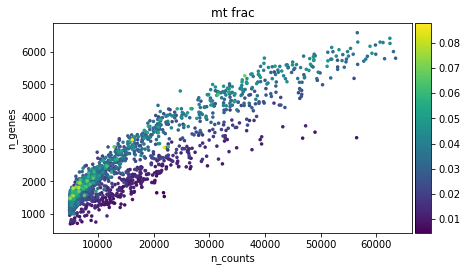

In [153]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [154]:
adata.obs_names = adata.obs_names.values + '-sampleP'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


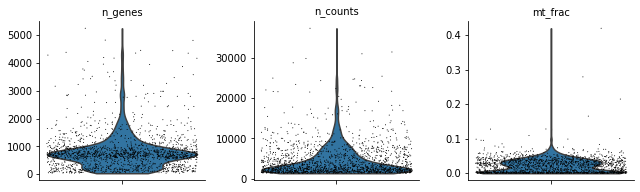

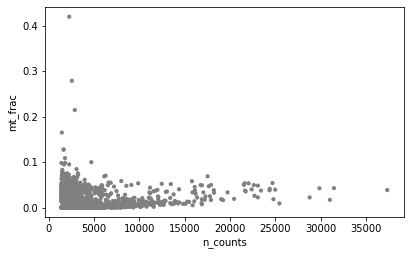

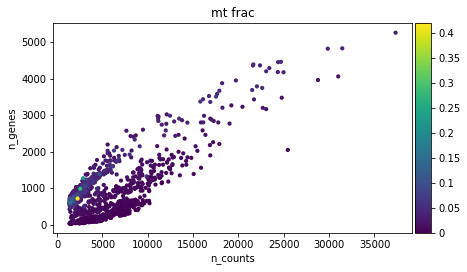

In [155]:
adata = sc.read('../data/oetjen/GSM3396177_matrix_Q.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396177_barcodes_Q.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396177_genes_Q.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

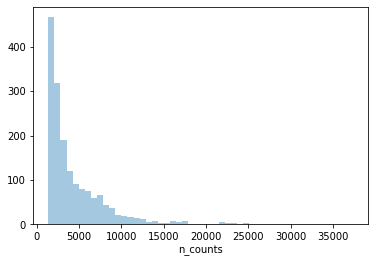

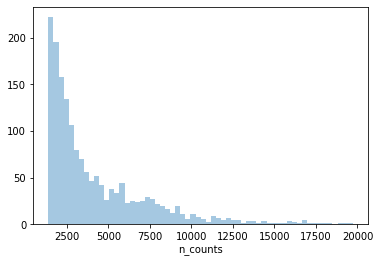

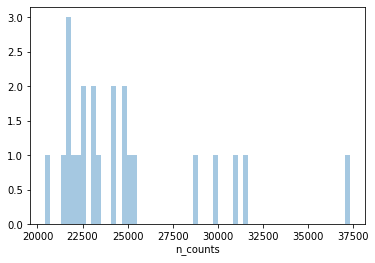

In [156]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<20000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [157]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 35000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Total number of cells: 1700
Number of cells after max count filter: 1699
Number of cells after MT filter: 1696


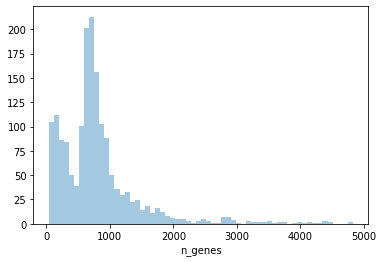

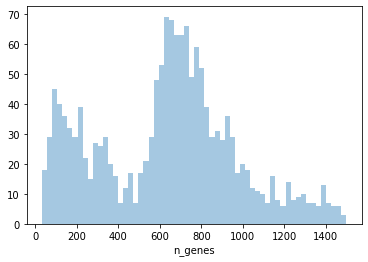

In [158]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1500], kde=False, bins=60)
plt.show()

In [159]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 400)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 1696


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 1273


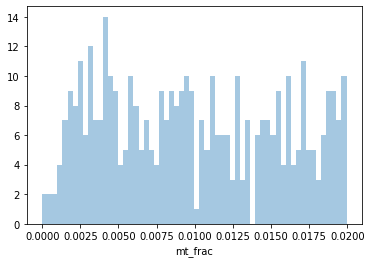

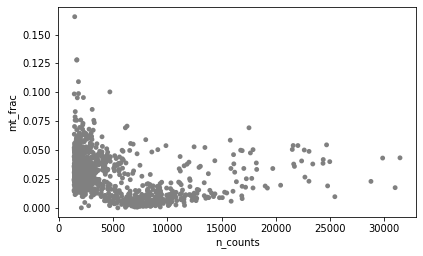

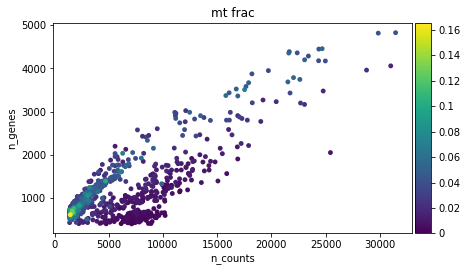

In [160]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [161]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.005) | (adata.obs['n_counts'] > 10000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 1273
Number of cells after filter: 1171


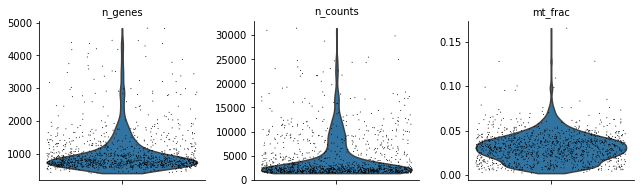

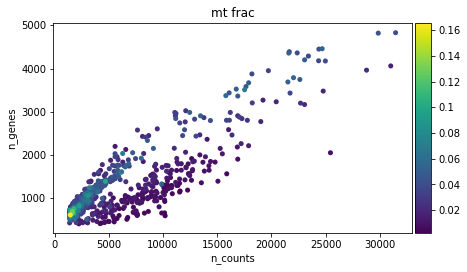

In [162]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [163]:
adata.obs_names = adata.obs_names.values + '-sampleQ'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


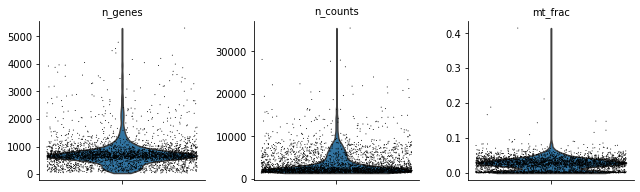

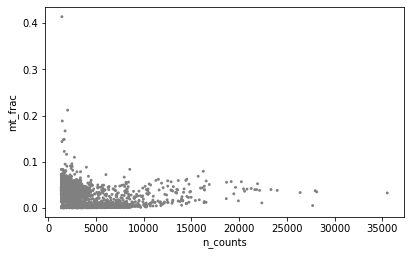

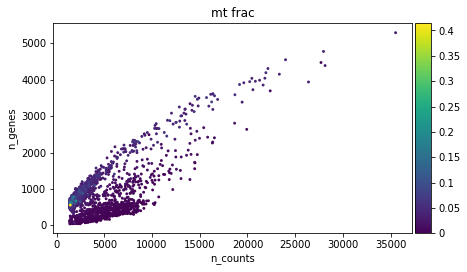

In [164]:
adata = sc.read('../data/oetjen/GSM3396178_matrix_R.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396178_barcodes_R.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396178_genes_R.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

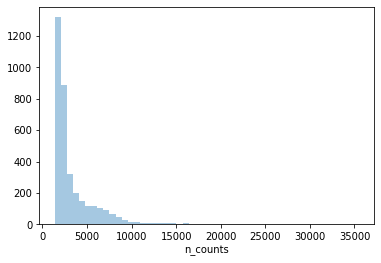

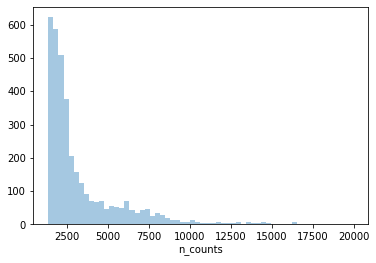

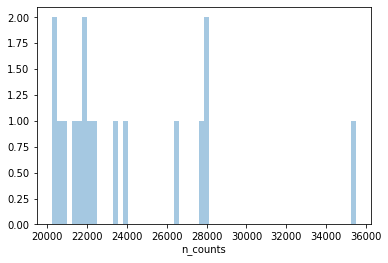

In [165]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<20000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [166]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 30000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 3593


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 3592
Number of cells after MT filter: 3590


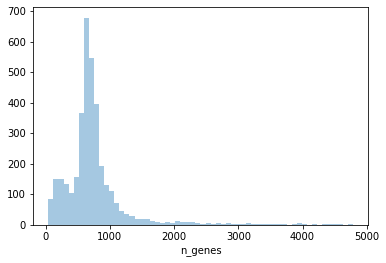

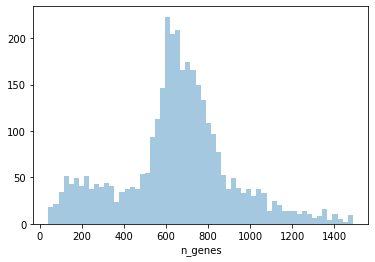

In [167]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1500], kde=False, bins=60)
plt.show()

In [168]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 400)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 3590


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 3028


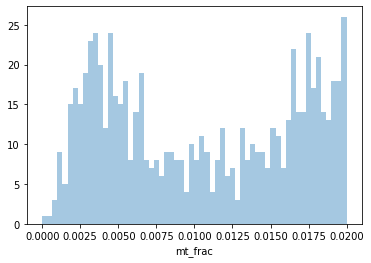

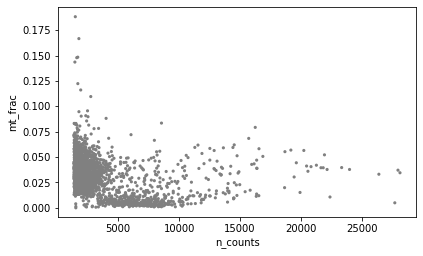

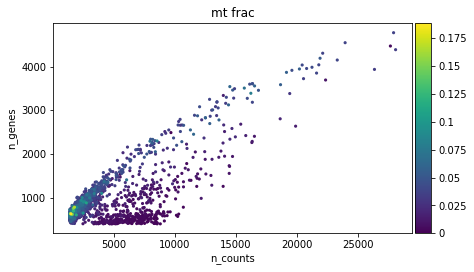

In [169]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [170]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.0075) | (adata.obs['n_counts'] > 10000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 3028
Number of cells after filter: 2745


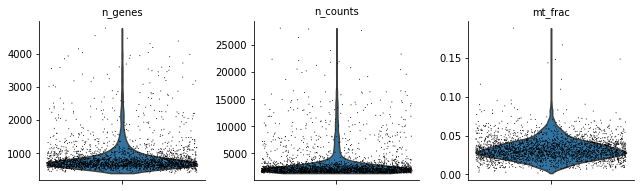

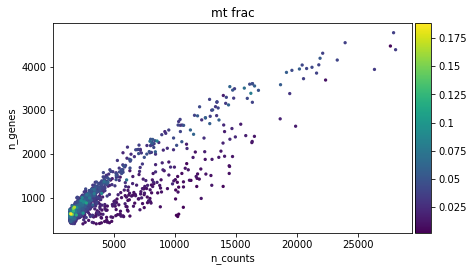

In [171]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [172]:
adata.obs_names = adata.obs_names.values + '-sampleR'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


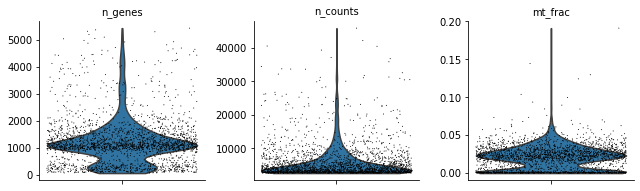

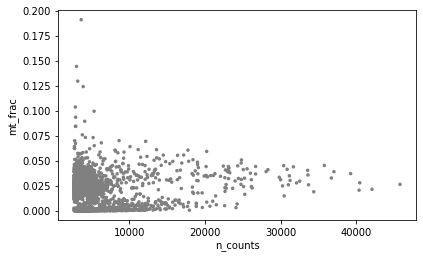

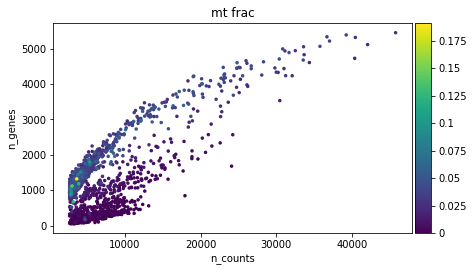

In [173]:
adata = sc.read('../data/oetjen/GSM3396179_matrix_S1.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396179_barcodes_S1.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396179_genes_S1.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

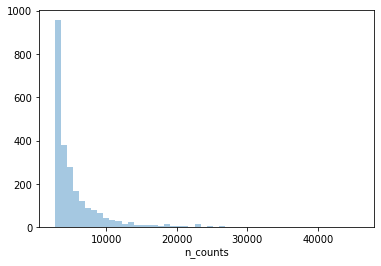

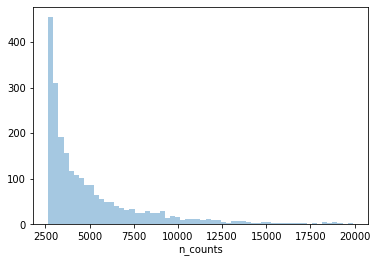

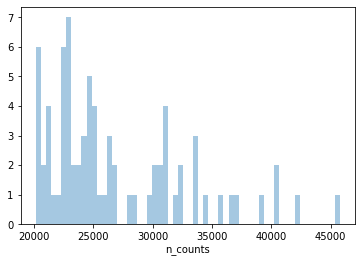

In [174]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<20000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [175]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 40000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.1]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 2437


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 2433
Number of cells after MT filter: 2428


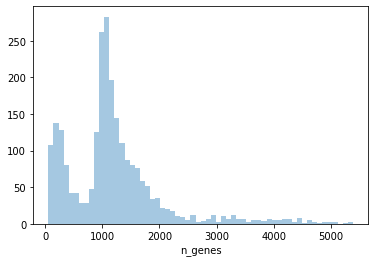

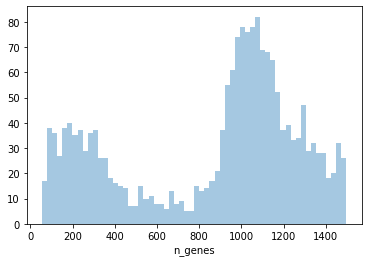

In [176]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1500], kde=False, bins=60)
plt.show()

In [177]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 600)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 2428


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 1889


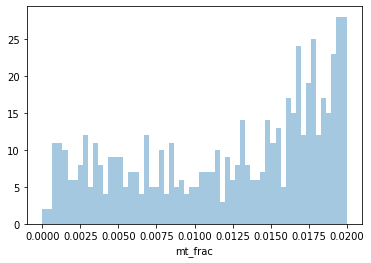

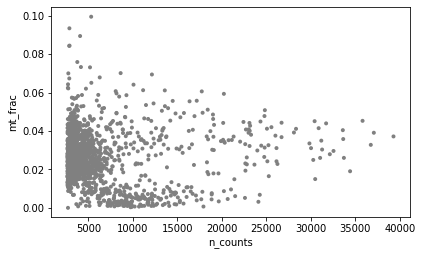

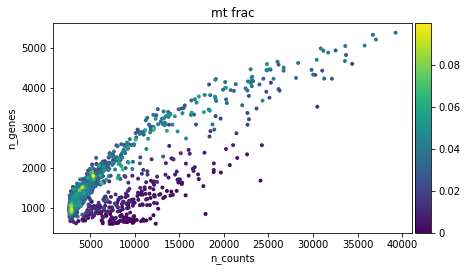

In [178]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [179]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.0075) | (adata.obs['n_counts'] > 15000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 1889
Number of cells after filter: 1740


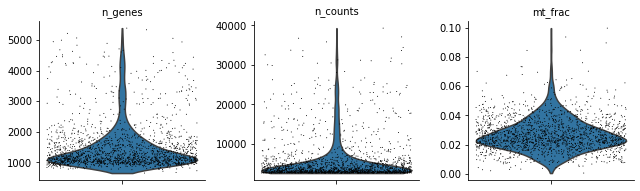

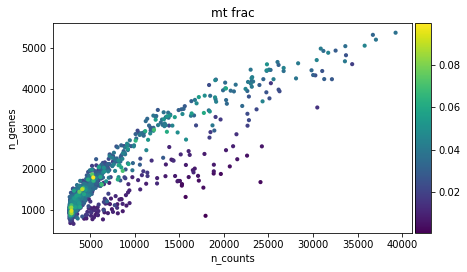

In [180]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [181]:
adata.obs_names = adata.obs_names.values + '-sampleS1'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


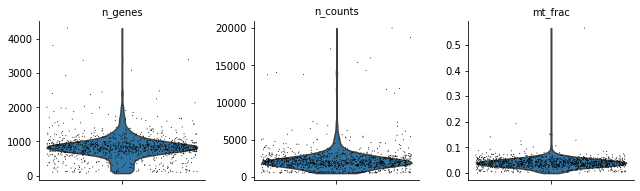

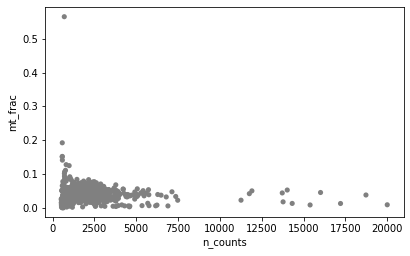

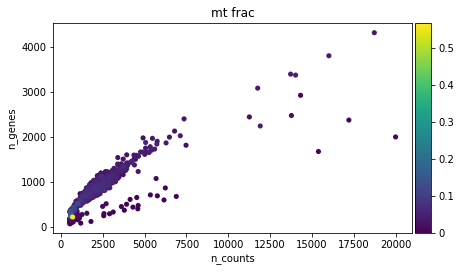

In [182]:
adata = sc.read('../data/oetjen/GSM3396180_matrix_Sk1.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396180_barcodes_Sk1.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396180_genes_Sk1.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

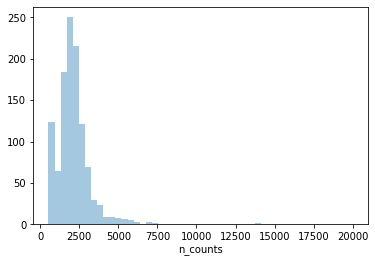

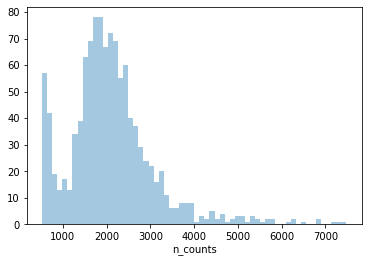

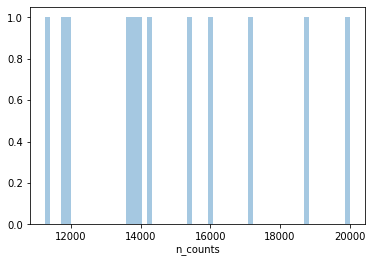

In [183]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<10000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>10000], kde=False, bins=60)
plt.show()

In [184]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 20000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Total number of cells: 1138
Number of cells after max count filter: 1137
Number of cells after MT filter: 1136


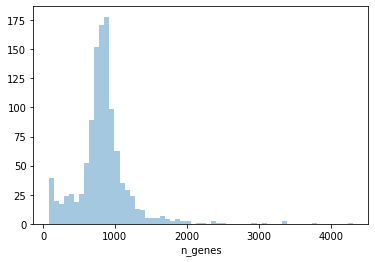

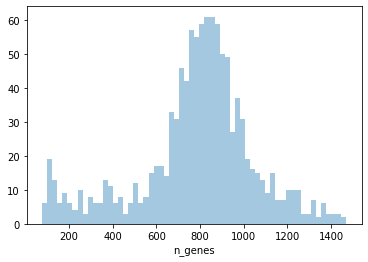

In [185]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1500], kde=False, bins=60)
plt.show()

In [186]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 500)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Trying to set attribute `.obs` of view, copying.


Total number of cells: 1136


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 991


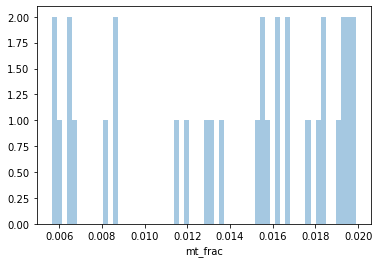

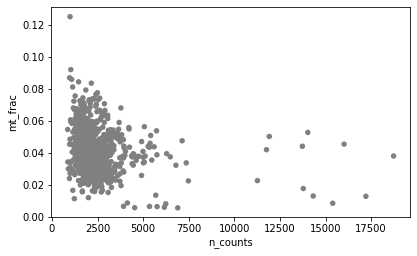

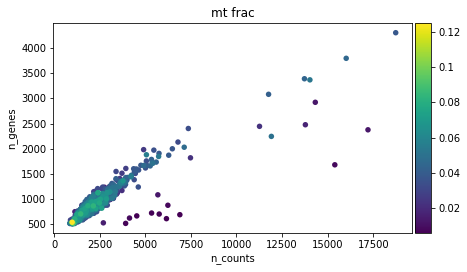

In [187]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [188]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.01) | (adata.obs['n_counts'] > 10000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 991
Number of cells after filter: 983


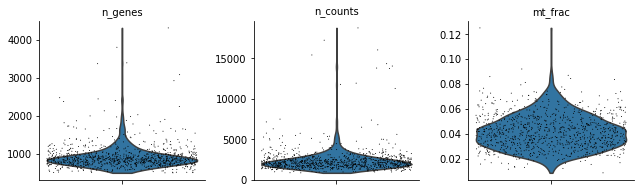

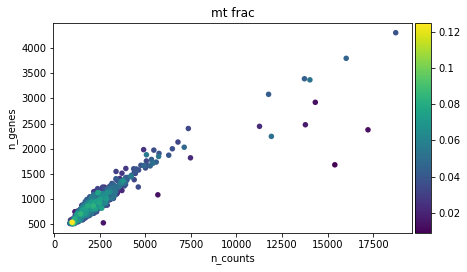

In [189]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [190]:
adata.obs_names = adata.obs_names.values + '-sampleSk1'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


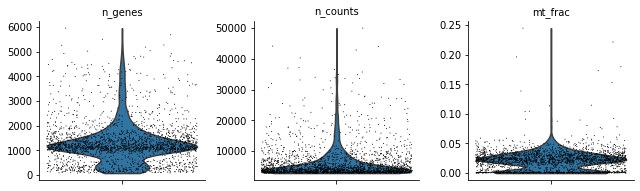

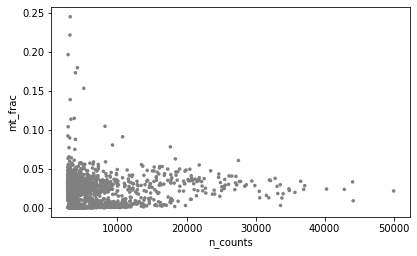

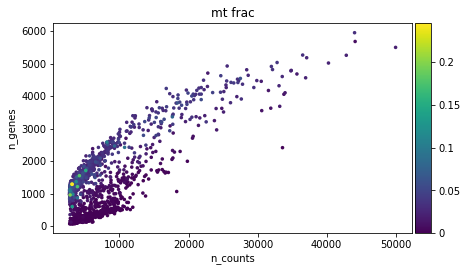

In [191]:
adata = sc.read('../data/oetjen/GSM3396181_matrix_S2.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396181_barcodes_S2.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396181_genes_S2.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

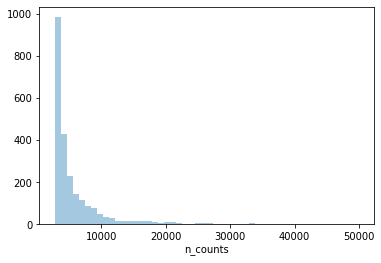

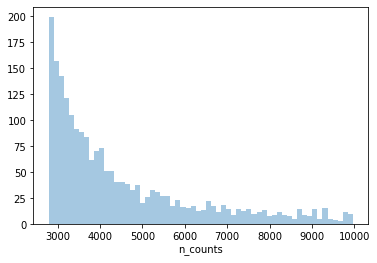

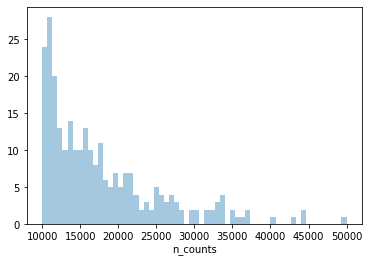

In [192]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<10000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>10000], kde=False, bins=60)
plt.show()

In [193]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 40000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.15]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 2367


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 2362
Number of cells after MT filter: 2356


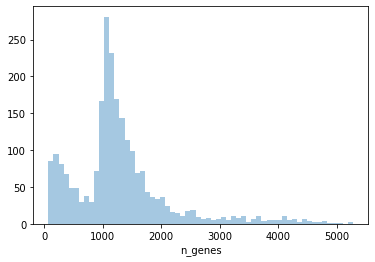

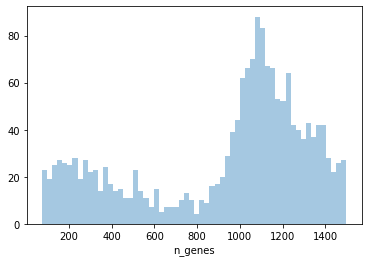

In [194]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1500], kde=False, bins=60)
plt.show()

In [195]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 600)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 2356


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 1931


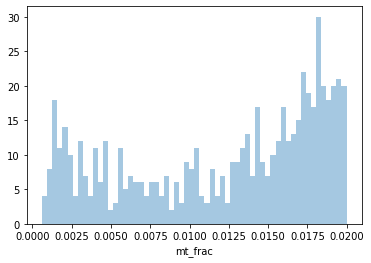

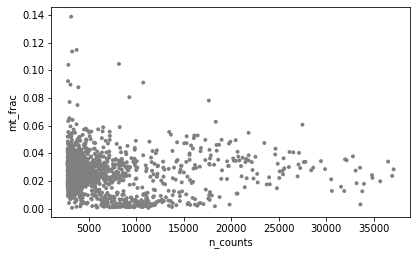

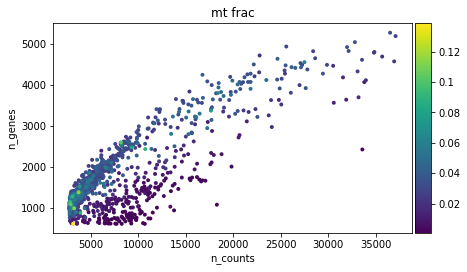

In [196]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [197]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.005) | (adata.obs['n_counts'] > 15000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 1931
Number of cells after filter: 1821


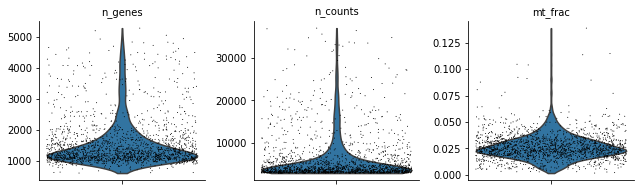

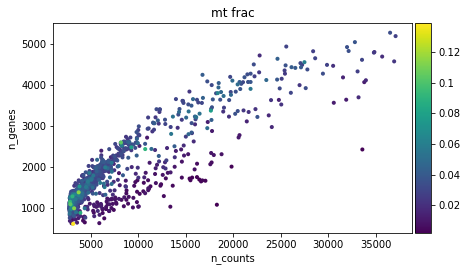

In [198]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [199]:
adata.obs_names = adata.obs_names.values + '-sampleS2'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


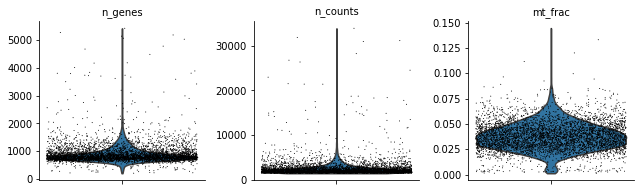

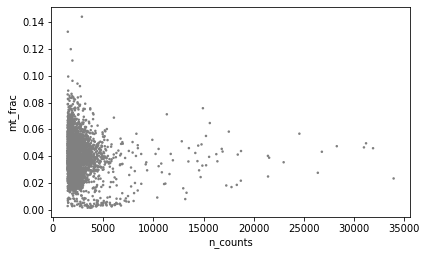

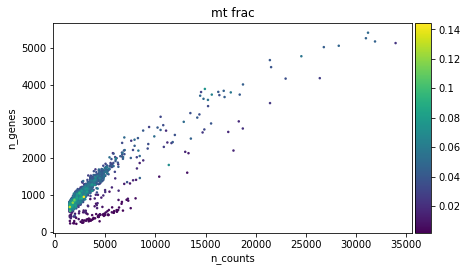

In [200]:
adata = sc.read('../data/oetjen/GSM3396182_matrix_Sk2.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396182_barcodes_Sk2.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396182_genes_Sk2.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

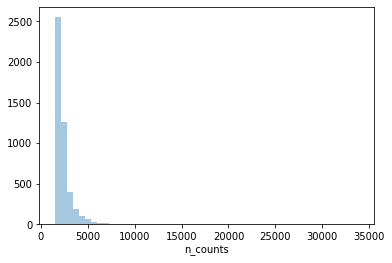

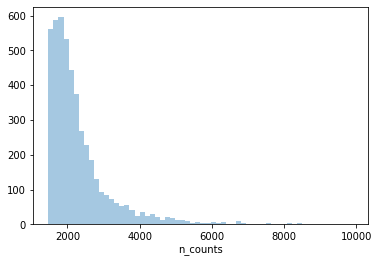

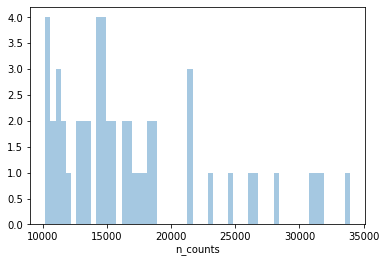

In [201]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<10000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>10000], kde=False, bins=60)
plt.show()

In [202]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 30000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.1]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 4726


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 4722
Number of cells after MT filter: 4718


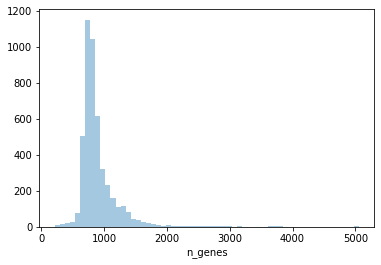

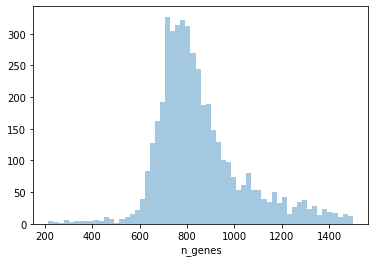

In [203]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1500], kde=False, bins=60)
plt.show()

In [204]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 500)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 4718


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 4654


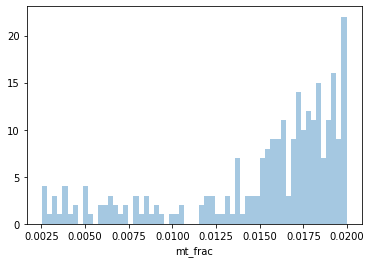

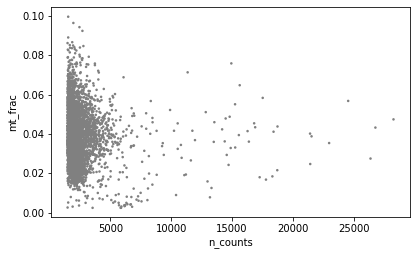

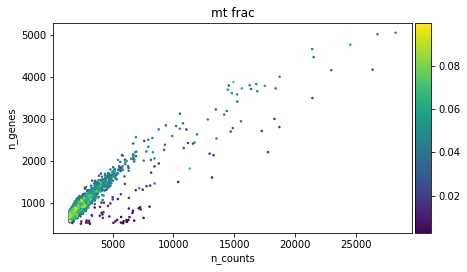

In [205]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [206]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.01) | (adata.obs['n_counts'] > 10000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 4654
Number of cells after filter: 4612


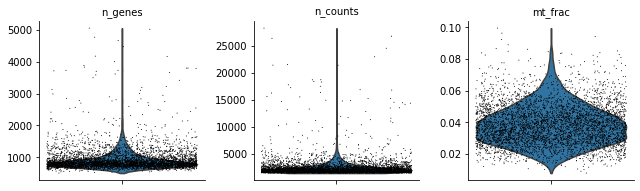

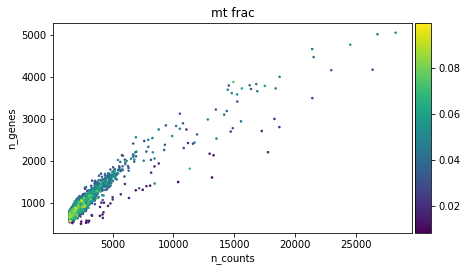

In [207]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [208]:
adata.obs_names = adata.obs_names.values + '-sampleSk2'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


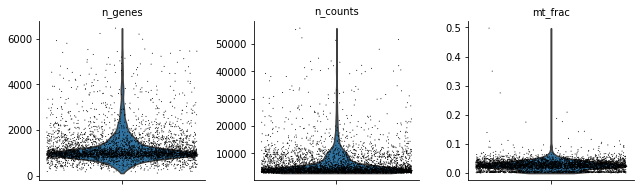

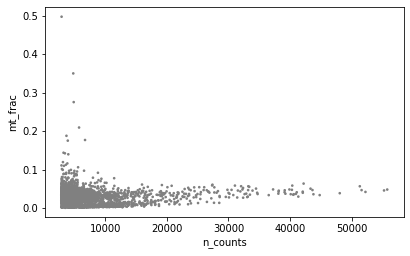

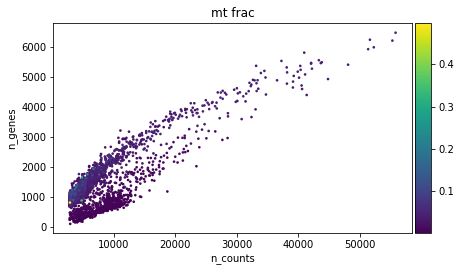

In [209]:
adata = sc.read('../data/oetjen/GSM3396183_matrix_T.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396183_barcodes_T.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396183_genes_T.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

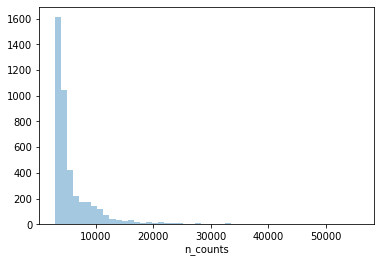

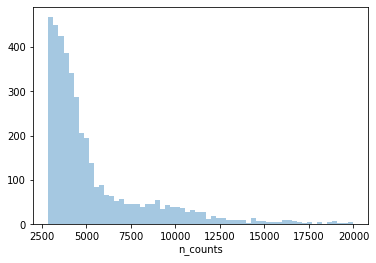

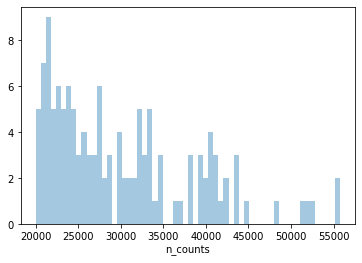

In [210]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<20000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [211]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 50000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 4293


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 4288
Number of cells after MT filter: 4284


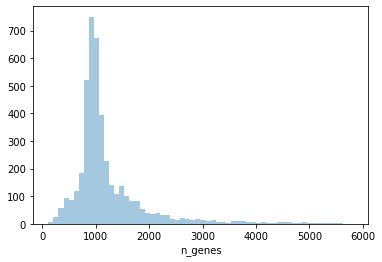

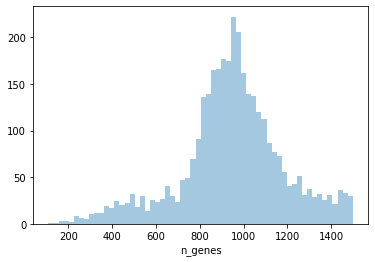

In [212]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1500], kde=False, bins=60)
plt.show()

In [213]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 500)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 4284


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 4089


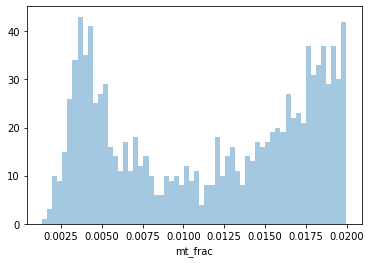

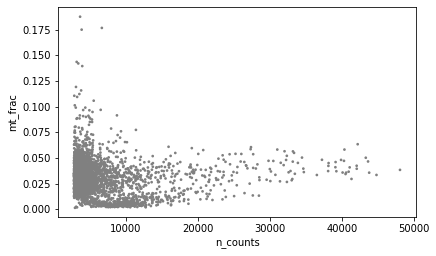

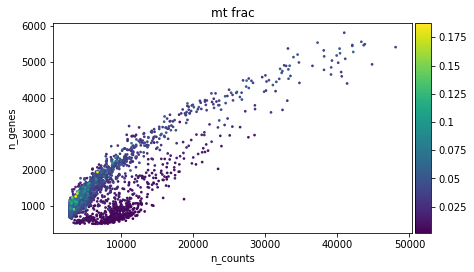

In [214]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [215]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.0075) | (adata.obs['n_counts'] > 20000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 4089
Number of cells after filter: 3696


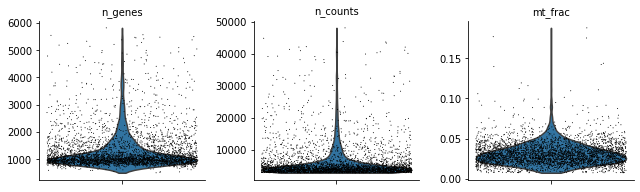

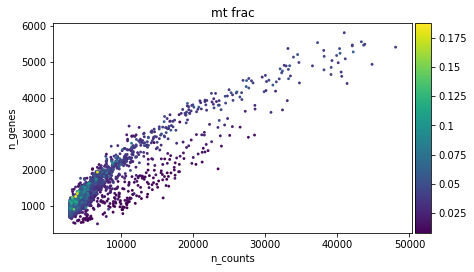

In [216]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [217]:
adata.obs_names = adata.obs_names.values + '-sampleT'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


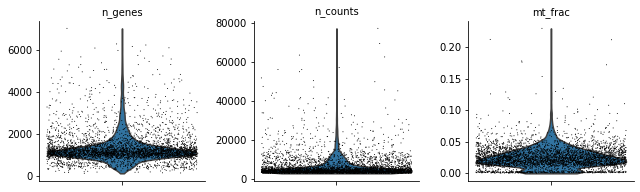

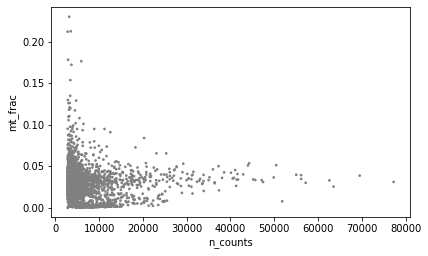

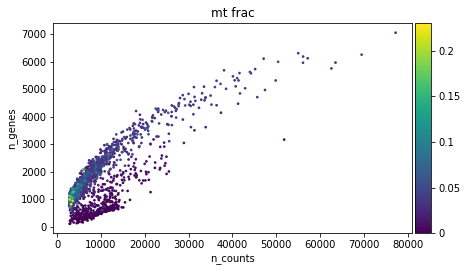

In [218]:
adata = sc.read('../data/oetjen/GSM3396184_matrix_U.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396184_barcodes_U.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396184_genes_U.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

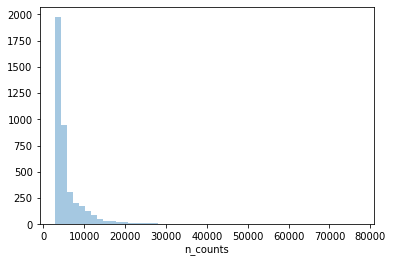

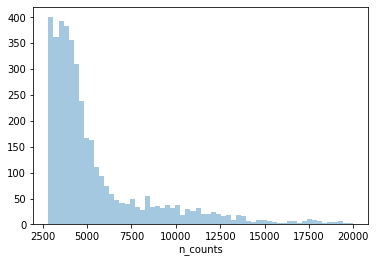

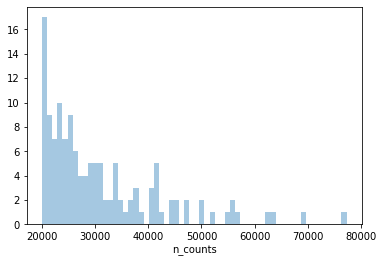

In [219]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<20000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [220]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 60000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.15]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 4118


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 4114
Number of cells after MT filter: 4107


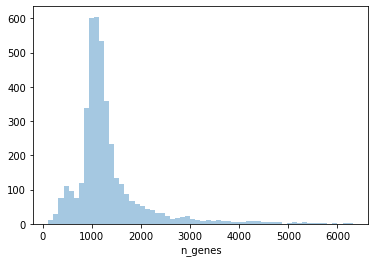

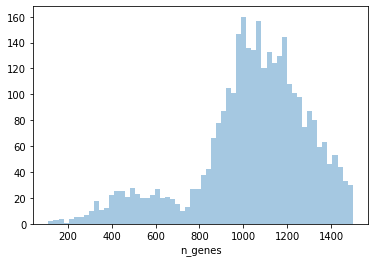

In [221]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1500], kde=False, bins=60)
plt.show()

In [222]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 700)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 4107


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 3726


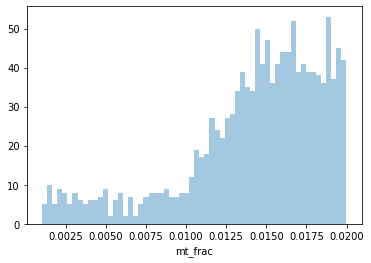

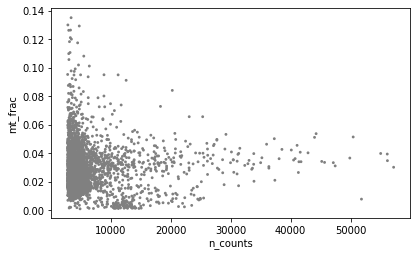

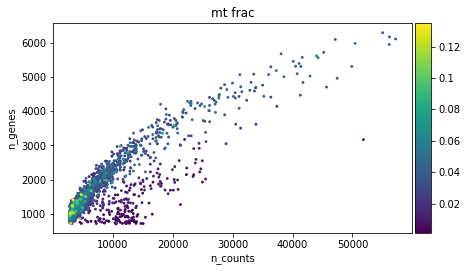

In [223]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [224]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.0075) | (adata.obs['n_counts'] > 20000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 3726
Number of cells after filter: 3608


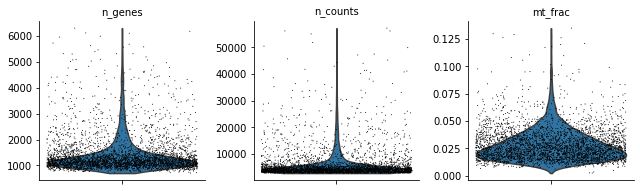

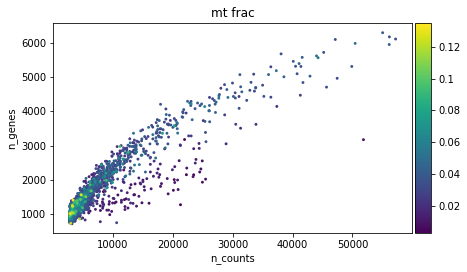

In [225]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [226]:
adata.obs_names = adata.obs_names.values + '-sampleU'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


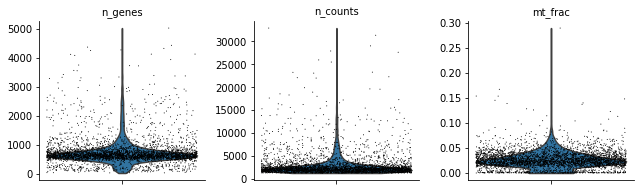

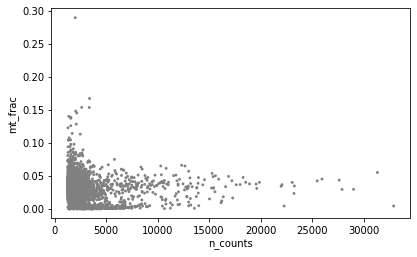

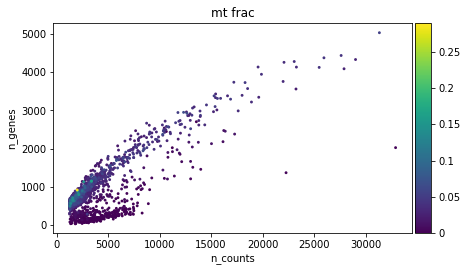

In [227]:
adata = sc.read('../data/oetjen/GSM3396185_matrix_W.mtx.gz').T
adata.obs_names = pd.read_csv('../data/oetjen/GSM3396185_barcodes_W.tsv.gz', delimiter='\t', header=None)[0].values
adata.var_names = pd.read_csv('../data/oetjen/GSM3396185_genes_W.tsv.gz', delimiter='\t', header=None)[1]

# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

adata.X = adata.X.toarray()
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

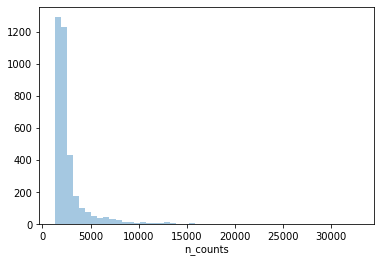

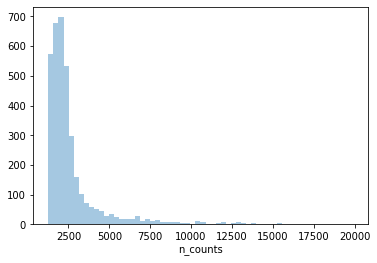

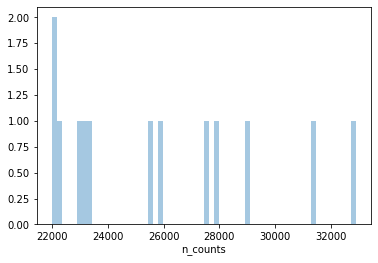

In [228]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<20000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [229]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 30000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.15]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

Total number of cells: 3643


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after max count filter: 3641
Number of cells after MT filter: 3637


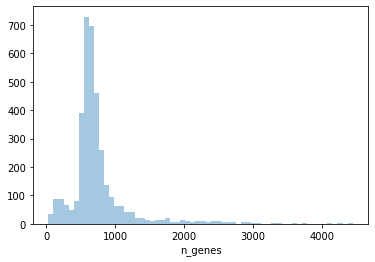

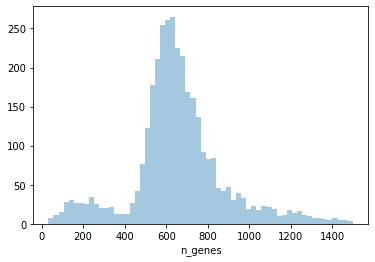

In [230]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 1500], kde=False, bins=60)
plt.show()

In [231]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 400)
print('Number of cells after min genes filter: {:d}'.format(adata.n_obs))

Total number of cells: 3637


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of cells after min genes filter: 3321


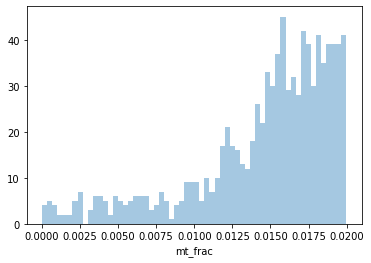

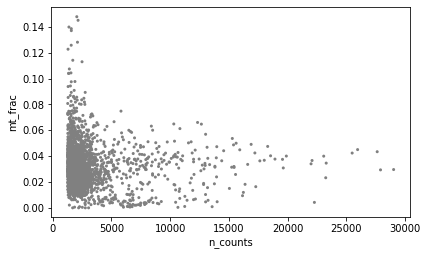

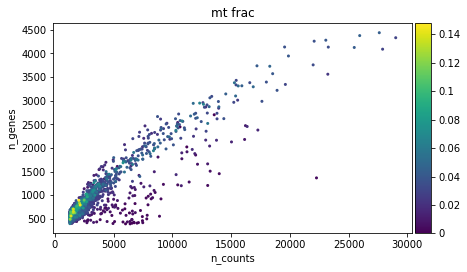

In [232]:
sb.distplot(adata.obs['mt_frac'][adata.obs['mt_frac'] < 0.02], kde=False, bins=60)
plt.show()
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [233]:
# Thresholding on number of counts and percent_mito
print('Total number of cells: {:d}'.format(adata.n_obs))
adata = adata[(adata.obs['mt_frac'] > 0.0075) | (adata.obs['n_counts'] > 10000)]

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 3321
Number of cells after filter: 3239


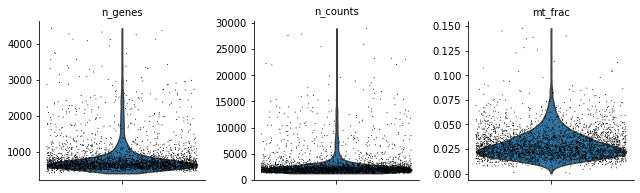

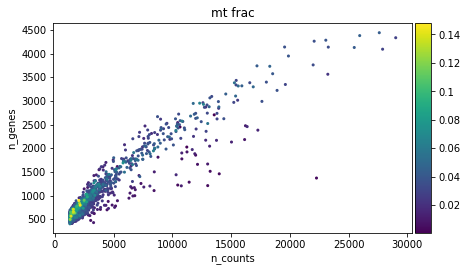

In [234]:
# visualise QC metrics after filtering
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

In [235]:
adata.obs_names = adata.obs_names.values + '-sampleW'
adata.var_names_make_unique()
adatas.append(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [236]:
# add some metadata to adatas before merging them
for i in range(0, len(adatas)):
    tmp = adatas[i]
    p = re.compile('[^-]+$')
    tmp.obs['sample'] = [p.search(x).group() for x in tmp.obs_names.values]
    p = re.compile('[A-Z]')
    tmp.obs['patient'] = [p.search(x).group() for x in tmp.obs['sample'].values]

In [238]:
# merge all samples
adata_merge = adatas[0].concatenate(adatas[1:], batch_key='sample_ID')

In [29]:
adata_merge.X = sparse.csr_matrix(adata_merge.X).astype(dtype='float32')
sc.pp.filter_genes(adata_merge, min_cells = 10)
adata_merge.layers['counts'] = adata_merge.X
sc.pp.normalize_per_cell(adata_merge, counts_per_cell_after=1e4)
sc.pp.log1p(adata_merge)
adata_merge

AnnData object with n_obs × n_vars = 73050 × 20613
    obs: 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'sample', 'patient', 'sample_ID'
    uns: 'log1p'
    layers: 'counts'

In [35]:
adata_merge.write('../data/oetjen/oetjen.h5ad')

-------------------------------
I used `../rscripts/singleR.R` to predict cell types using the granja data as a reference. Will take a look and make sure they're ok.

In [2]:
# read in data and labels
adata = sc.read('../data/oetjen/oetjen.h5ad')
labs = pd.read_csv('../data/oetjen/oetjen_cell_labels.csv', sep='\t')
adata.obs['celltype'] = labs['label']

/home/sennis/anaconda3/lib/python3.7/site-packages/numba/compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../home/sennis/anaconda3/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  self.func_ir.loc))
/home/sennis/anaconda3/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../home/sennis/anaconda3/lib/python3.

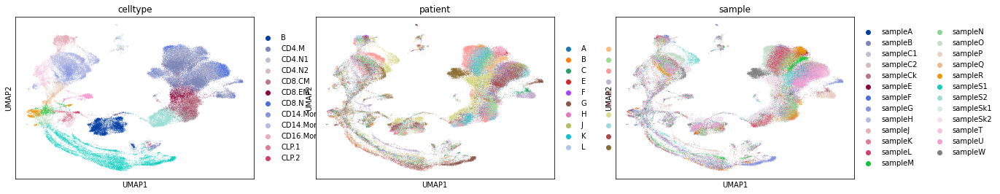

In [3]:
# calculate visualistions
sc.pp.highly_variable_genes(adata, n_top_genes=4000)
sc.pp.pca(adata, n_comps=30, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['celltype', 'patient', 'sample'])

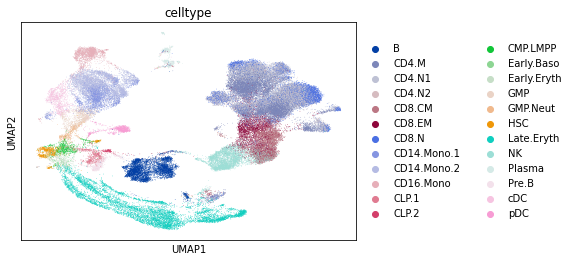

In [4]:
sc.pl.umap(adata, color='celltype')

In [5]:
adata.obs['celltype'].value_counts()

CD4.M          13735
CD4.N1         11237
Late.Eryth      7201
CD14.Mono.2     5204
CD8.N           5113
CD8.CM          5007
B               4790
NK              4520
CD8.EM          2795
CD14.Mono.1     2458
CD16.Mono       1776
CD4.N2          1531
cDC             1111
GMP             1092
HSC              831
CLP.1            758
pDC              743
CMP.LMPP         693
Pre.B            661
Plasma           584
Early.Eryth      527
GMP.Neut         468
CLP.2            169
Early.Baso        46
Name: celltype, dtype: int64

In [6]:
# Labels look pretty good! Will save object with labels
adata.write('../data/oetjen/oetjen.h5ad')